# EDA - Analisis Exploratorio de Datos
Proyecto: Recomendador de Cultivos California (TFM)
Fuentes: CDL/USDA + PRISM (historico) + NASA NEX-GDDP-CMIP6 (futuro) + gSSURGO (suelo)

In [64]:
# imports librerias
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns
from pymongo import MongoClient
import os
import sys
import matplotlib.patches as mpatches
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.patches import Polygon
from shapely.geometry import Point
import geopandas as gpd
import contextily as cx
import pandas as pd
import numpy as np
import matplotlib.ticker as ticker
import matplotlib.patheffects as pe
import requests
import zipfile
import io
# Buscamos la raíz del proyecto
current_dir = os.path.abspath(os.getcwd())
while current_dir != os.path.dirname(current_dir):
    if "main.py" in os.listdir(current_dir):
        break
    current_dir = os.path.dirname(current_dir)

# Registramos la raíz exacta en el sistema de Python
if current_dir not in sys.path:
    sys.path.insert(0, current_dir)

#Llamamos las configuraciones de mongo
from src.config import MONGO_URI, DB_NAME, COLLECTION_NAME
from src.utils import TARGET_CROPS, HIST_CLIM_VARS, FUT_CLIM_VARS , SOIL_VARIABLES_DICT, FINAL_CROPS


In [65]:
# Definimos la ruta de la carpeta de resultados (relativa a la raíz de tu proyecto)
OUTPUT_DIR = "C:/Users/lesli/Documents/TFM/notebooks/eda_outputs"

# Creamos la carpeta automáticamente si no existe (exist_ok=True evita que lance error si ya existe)
os.makedirs(OUTPUT_DIR, exist_ok=True)

print(f"Carpeta de almacenamiento lista en: '{OUTPUT_DIR}'")

Carpeta de almacenamiento lista en: 'C:/Users/lesli/Documents/TFM/notebooks/eda_outputs'


In [66]:
# ── Configuracion visual ────────────────────────────────────────────────────
sns.set_theme(style="white", font_scale=1.05)
plt.rcParams["figure.dpi"] = 140
os.makedirs(OUTPUT_DIR, exist_ok=True)

def save(fig, name):
    path = os.path.join(OUTPUT_DIR, name)
    fig.savefig(path,dpi=300, bbox_inches="tight")
    print(f"  [guardado] {path}")
   

In [67]:
#  CONFIGURACIÓN GLOBAL ESTILO 

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman", "Latin Modern Roman", "Times New Roman"],
    "axes.titlesize": 14,
    "axes.labelsize": 11,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "figure.dpi": 140,
    "axes.titleweight": "bold",
    "axes.labelweight": "bold"
})

# Paleta Institucional TFM
COLOR_MAIN = "#2e5b94"     # Azul académico
COLOR_BG = "#f8fafc"       # Gris muy sutil para fondos si se requiere
COLOR_TEXT = "#334155"     # Gris pizarra para textos principales
COLOR_ANNOT = "#475569"    # Gris ceniza para anotaciones

sns.set_theme(style="white", rc=plt.rcParams)


# FUNCIONES REUTILIZABLES DE GRÁFICOS 

def plot_linea_tfm(x, y, titulo, xlabel, ylabel, min_annot=False):
    """Genera un gráfico de línea temporal estándar para el TFM."""
    fig, ax = plt.subplots(figsize=(12, 5.5))
    
    ax.plot(x, y, color=COLOR_MAIN, linewidth=2.5, marker="o", 
            markersize=7, markeredgecolor="white", markeredgewidth=1.5)
    ax.fill_between(x, y, color=COLOR_MAIN, alpha=0.05)
    
    ax.set_title(titulo, pad=20, color=COLOR_TEXT)
    ax.set_xlabel(xlabel, labelpad=12, color=COLOR_TEXT)
    ax.set_ylabel(ylabel, labelpad=12, color=COLOR_TEXT)
    
    # Formateo
    ax.set_xticks(x)
    ax.set_xticklabels([str(val) for val in x], rotation=45, ha="right", color=COLOR_ANNOT)
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda val, pos: f"{int(val):,}"))
    ax.tick_params(colors=COLOR_ANNOT)
    
    if min_annot:
        min_idx = list(y).index(min(y))
        ax.annotate(f"Mínimo\n({y[min_idx]:,})",
                    xy=(x[min_idx], y[min_idx]), xytext=(0, -35), textcoords="offset points",
                    ha='center', va='top', fontsize=10, color='#b91c1c',
                    arrowprops=dict(arrowstyle="->", color='#b91c1c'))

    ax.grid(False)
    sns.despine(left=True)
    plt.tight_layout()
    return fig, ax


def plot_barras_h_tfm(categorias, valores, titulo, ylabel):
    """Genera un gráfico de barras horizontales (ideal para variables categóricas largas)."""
    fig, ax = plt.subplots(figsize=(12, 7))
    
    barras = ax.barh(categorias, valores, color=COLOR_MAIN, edgecolor='none', height=0.6)
    ax.invert_yaxis() # Para que el valor más alto quede arriba
    
    # Etiquetas de datos automáticas
    max_val = max(valores)
    for barra in barras:
        ancho = barra.get_width()
        ax.text(ancho + (max_val * 0.01), barra.get_y() + barra.get_height() / 2,
                f'{int(ancho):,}', va='center', ha='left', fontsize=10, color=COLOR_ANNOT)
                
    ax.set_title(titulo, pad=20, color=COLOR_TEXT)
    ax.set_ylabel(ylabel, labelpad=12, color=COLOR_TEXT)
    
    ax.grid(False)
    ax.set_xticks([]) # Ocultamos el eje X porque ya tenemos las etiquetas numéricas
    sns.despine(left=True, bottom=True)
    plt.tight_layout()
    return fig, ax


def plot_barras_v_tfm(categorias, valores, titulo, xlabel, ylabel, rotacion_x=0):
    """Genera un gráfico de barras verticales."""
    fig, ax = plt.subplots(figsize=(10, 6))
    
    barras = ax.bar(categorias, valores, color=COLOR_MAIN, edgecolor='none', width=0.6)
    
    # Etiquetas de datos automáticas
    max_val = max(valores)
    for barra in barras:
        alto = barra.get_height()
        ax.text(barra.get_x() + barra.get_width() / 2, alto + (max_val * 0.02),
                f'{int(alto):,}', ha='center', va='bottom', fontsize=10, color=COLOR_ANNOT)
                
    ax.set_title(titulo, pad=20, color=COLOR_TEXT)
    ax.set_xlabel(xlabel, labelpad=12, color=COLOR_TEXT)
    ax.set_ylabel(ylabel, labelpad=12, color=COLOR_TEXT)
    
    ax.set_xticklabels(categorias, rotation=rotacion_x, color=COLOR_ANNOT)
    ax.set_yticks([]) # Ocultamos el eje Y porque ya tenemos las etiquetas arriba
    
    ax.grid(False)
    sns.despine(left=True, bottom=False)
    ax.spines['bottom'].set_color('#cbd5e1')
    plt.tight_layout()
    return fig, ax

In [68]:
# Conexión a MongoDB
client = MongoClient(MONGO_URI)
db = client[DB_NAME]
collection = db[COLLECTION_NAME]

# traemos TODOS los documentos 
cursor = collection.find({}, {"_id": 0})
datos_lista = list(cursor)

df_raw = pl.DataFrame(datos_lista, infer_schema_length=None)

print(f"Dimensiones: {df_raw.shape[0]} filas, {df_raw.shape[1]} columnas.")

Dimensiones: 1109452 filas, 41 columnas.


# Overview del Dataset: Raw data

In [69]:
# Mostrar las primeras 5 filas
print("Primeras filas del dataset:")
display(df_raw.head())

Primeras filas del dataset:


year,crop_id,crop_name,is_target,location,processed,ppt,processed_climate,tmax,tmean,tmin,vpdmax,vpdmin,awc_r,cec7_r,claytotal_r,dbthirdbar_r,ec_r,ecec_r,ksat_r,om_r,pbray1_r,ph1to1h2o_r,processed_soil,profundidad_efectiva_cm,ptotal_r,sandtotal_r,silttotal_r,sumbases_r,es_proyeccion,hurs_245,hurs_585,pr_245,pr_585,referencia_base,tmax_245,tmax_585,tmean_245,tmean_585,tmin_245,tmin_585
i64,i64,str,bool,struct[2],bool,f64,bool,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,bool,f64,null,f64,f64,f64,bool,f64,f64,f64,f64,i64,f64,f64,f64,f64,f64,f64
2008,2,"""Cotton""",true,"{""Point"",[-120.703207, 37.125374]}",false,203.770004,true,23.848001,15.783001,7.719,22.509001,1.777,0.15,15.0,31.0,1.35,3.0,null,2.7,0.75,null,8.2,true,30.0,null,35.400002,33.599998,null,null,null,null,null,null,null,null,null,null,null,null,null
2008,212,"""Oranges""",true,"{""Point"",[-119.113253, 35.622238]}",false,129.257004,true,24.682001,17.624001,10.568001,25.107,4.256,0.17,24.4,31.0,1.45,0.0,null,9.0,0.75,null,7.9,true,46.0,null,35.400002,33.599998,null,null,null,null,null,null,null,null,null,null,null,null,null
2008,3,"""Rice""",true,"{""Point"",[-121.880199, 39.018031]}",false,370.766022,true,23.924002,16.358002,8.792001,23.787001,2.398,0.16,48.5,59.299999,1.18,0.9,null,0.42,3.99,null,6.8,true,9.0,null,0.9,39.799999,45.0,null,null,null,null,null,null,null,null,null,null,null,null
2008,75,"""Almonds""",true,"{""Point"",[-119.128831, 35.717057]}",false,131.94101,true,24.880001,17.76,10.641001,25.513,4.177,0.11,7.5,15.0,1.55,1.0,null,28.0,0.75,null,7.9,true,28.0,null,65.900002,19.1,null,null,null,null,null,null,null,null,null,null,null,null,null
2008,69,"""Grapes""",true,"{""Point"",[-120.119889, 37.04136]}",false,206.222015,true,24.250002,16.461,8.673,24.395,2.449,0.09,8.1,15.0,1.55,1.0,null,5.5,1.0,null,6.3,true,23.0,null,66.0,19.0,6.9,null,null,null,null,null,null,null,null,null,null,null,null


### Tipos de Datos

In [70]:
tabla_esquema = pl.DataFrame({
    "Columna": list(df_raw.schema.keys()),
    "Tipo de Dato": [str(dtype) for dtype in df_raw.schema.values()]
})

#visualizar
with pl.Config(tbl_rows=-1):
    display(tabla_esquema)

Columna,Tipo de Dato
str,str
"""year""","""Int64"""
"""crop_id""","""Int64"""
"""crop_name""","""String"""
"""is_target""","""Boolean"""
"""location""","""Struct({'type': String, 'coord…"
"""processed""","""Boolean"""
"""ppt""","""Float64"""
"""processed_climate""","""Boolean"""
"""tmax""","""Float64"""


### Cultivos que tenemos dentro del dataset

In [71]:
#Distribución de observaciones por Tipo de Cultivo
# Agrupar por cultivo y contar
crop_counts = (
    df_raw.group_by(["crop_id", "crop_name"])
    .agg(pl.count().alias("Muestras"))
    .sort("Muestras", descending=True)
)
with pl.Config(tbl_rows=-1, tbl_cols=-1):
    display(crop_counts)



C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\3168669854.py:5: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  .agg(pl.count().alias("Muestras"))


crop_id,crop_name,Muestras
i64,str,u32
75,"""Almonds""",153512
36,"""Alfalfa""",152531
61,"""Fallow/ Idle Cropland""",148870
69,"""Grapes""",93617
3,"""Rice""",57631
37,"""Other Hay/Non Alfalfa""",55237
24,"""Winter Wheat""",53330
76,"""Walnuts""",47375
204,"""Pistachios""",46255


**Homologar cultivos de Lechuga**

Existen datos de parcelas que tienen cultivos de lechuga con otros cultivos, dado que nuestro cultivo de interes es lechuga y en estas tierras se encuentra sembrada lechuga renombraremos estos cultivos como "Lettuce" y el codigo como "227"

In [72]:
df2 = df_raw.clone()

In [73]:
#Homologar cultivos de lechuga
# Aplicamos la lógica de homologación usando pl.when().then().otherwise()

df2 = df2.with_columns([
    # 1. Homologación de CROP_ID
    pl.when(pl.col("crop_id").is_in([231, 233])).then(227)
        .otherwise(pl.col("crop_id"))
    .alias("crop_id"),

    # 2. Homologación de CROP_NAME
    pl.when(pl.col("crop_id").is_in([231,233,227])).then(pl.lit("Lettuce"))
    .otherwise(pl.col("crop_name"))
    .alias("crop_name")
])

In [74]:
#Homologar cultivos de trigo
# Aplicamos la lógica de homologación usando pl.when().then().otherwise()
df2 = df2.with_columns([
    # 1. Homologación de CROP_ID
    pl.when(pl.col("crop_id").is_in([236,225,22,234])).then(24)
        .otherwise(pl.col("crop_id"))
    .alias("crop_id"),

    # 2. Homologación de CROP_NAME
    pl.when(pl.col("crop_id").is_in([236,225,22,234,24])).then(pl.lit("Wheat"))
    .otherwise(pl.col("crop_name"))
    .alias("crop_name")
])

#234	"Dbl Crop Durum Wht/Sorghum"	


In [75]:
# Validamos que ahora sí se hayan fusionado correctamente
check_cultivos = (
    df2.group_by(["crop_id", "crop_name"])
    .agg(pl.count().alias("Total Muestras"))
    .sort("Total Muestras", descending=True)
)

with pl.Config(tbl_rows=-1):
    display(check_cultivos)

C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\1085382416.py:4: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  .agg(pl.count().alias("Total Muestras"))


crop_id,crop_name,Total Muestras
i64,str,u32
75,"""Almonds""",153512
36,"""Alfalfa""",152531
61,"""Fallow/ Idle Cropland""",148870
69,"""Grapes""",93617
24,"""Wheat""",81420
3,"""Rice""",57631
37,"""Other Hay/Non Alfalfa""",55237
76,"""Walnuts""",47375
204,"""Pistachios""",46255


### Creación dataset con cultivos priorizados

In [76]:
#  Extraemos las llaves (IDs de los cultivos) para usarlas como filtro
target_crop_ids = [cid for cid in TARGET_CROPS.keys() if cid != 238] + [24, 36]

#Filtramos el DataFrame usando la eficiencia de Polars
# El método .is_in() busca si el 'crop_id' de la fila pertenece a nuestra lista
df2 = df2.filter(pl.col("crop_id").is_in(target_crop_ids))

print(f"Dimensiones originales: {df_raw.shape[0]} filas, {df_raw.shape[1]} columnas.")
print(f"Dimensiones del dataset filtrado: {df2.shape[0]} filas, {df2.shape[1]} columnas.")

Dimensiones originales: 1109452 filas, 41 columnas.
Dimensiones del dataset filtrado: 706694 filas, 41 columnas.


C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\2422127207.py:4: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  .agg(pl.count().alias("Total Muestras"))


crop_id,crop_name,Total Muestras
i64,str,u32
75,"""Almonds""",153512
36,"""Alfalfa""",152531
69,"""Grapes""",93617
24,"""Wheat""",81420
3,"""Rice""",57631
76,"""Walnuts""",47375
204,"""Pistachios""",46255
54,"""Tomatoes""",28897
2,"""Cotton""",27591


  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\01_distribucion_cultivos.png


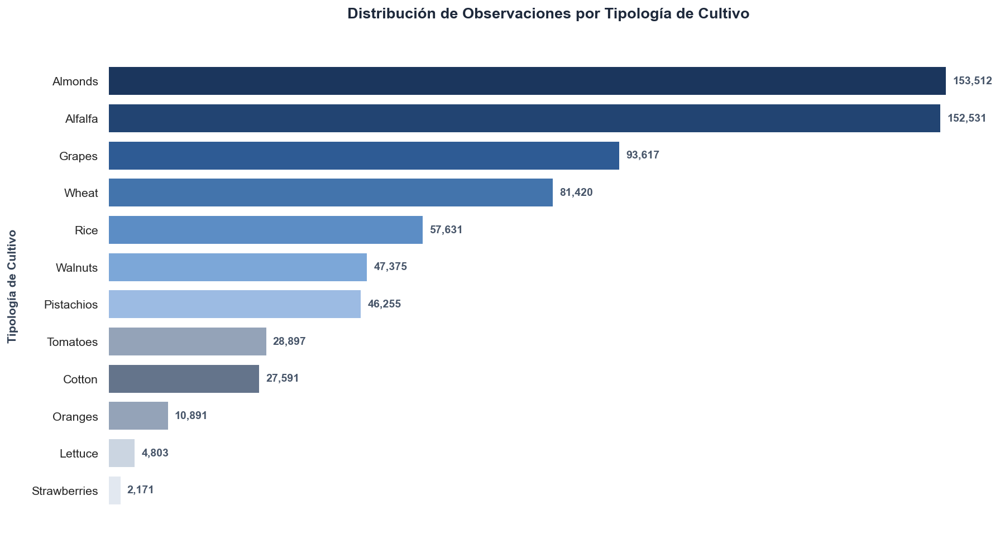

In [77]:
# Validamos qué cultivos quedaron y cuántas muestras tiene cada uno
check_cultivos = (
    df2.group_by(["crop_id", "crop_name"])
    .agg(pl.count().alias("Total Muestras"))
    .sort("Total Muestras", descending=True)
)

with pl.Config(tbl_rows=-1):
    display(check_cultivos)

#Grafico 
# 1. Extraemos los datos actualizados y homologados desde tu DataFrame de Polars
crop_names = check_cultivos["crop_name"].to_list()
total_muestras = check_cultivos["Total Muestras"].to_list()

# 2. Configuración del estilo institucional (Fondo blanco impoluto, sin cuadrículas)
sns.set_theme(style="white")
fig, ax = plt.subplots(figsize=(13, 7))

# 3. PALETA ACADÉMICA DE AZULES Y GRISES (Gama de degradado neutro)
# Diseñada a medida: los cultivos dominantes usan azules académicos profundos,
# transitando hacia grises pizarra y ceniza suaves para las clases minoritarias.
colores_academicos = [
    "#1b365d",  # 1. Almonds (Azul Marino Institucional)
    "#224472",  # 2. Alfalfa
    "#2e5b94",  # 3. Grapes
    "#4374ac",  # 4. Wheat (Clase unificada)
    "#5c8dc5",  # 5. Rice
    "#7ca7d8",  # 6. Walnuts
    "#9cbbe3",  # 7. Pistachios (Transición a gris)
    "#94a3b8",  # 8. Tomatoes (Gris Pizarra Medio)
    "#64748b",  # 9. Cotton
    "#94a3b8",  # 10. Oranges
    "#cbd5e1",  # 11. Lettuce
    "#e2e8f0"   # 12. Strawberries (Gris Ceniza Claro)
]

# 4. Crear el gráfico de barras horizontales
barras = ax.barh(crop_names, total_muestras, color=colores_academicos, edgecolor='none', height=0.75)

# Invertir el eje Y para mantener el orden jerárquico descendente
ax.invert_yaxis()

# 5. Etiquetas de datos numéricos con formato editorial al final de cada barra
max_val = max(total_muestras)
for barra in barras:
    ancho = barra.get_width()
    ax.text(
        ancho + (max_val * 0.008),          # Margen sutil a la derecha del final de la barra
        barra.get_y() + barra.get_height() / 2, # Centrado vertical perfecto
        f'{int(ancho):,}',                  # Formato con separador de miles estándar
        va='center',
        ha='left',
        fontsize=10,
        fontweight='bold',
        color='#475569'                     # Texto en gris oscuro neutro en lugar de negro puro
    )

# 6. Personalización de Títulos y Ejes (Tipografías limpias)
ax.set_title("Distribución de Observaciones por Tipología de Cultivo", fontsize=14, fontweight='bold', pad=25, color='#1e293b')
ax.set_ylabel("Tipología de Cultivo", fontsize=11, fontweight='semibold', labelpad=12, color='#334155')

# 7. Eliminación absoluta de elementos redundantes (Limpieza Cartesiana)
ax.grid(False)             # Sin cuadrícula
ax.set_xticks([])          # Sin marcas en el eje X
ax.set_xticklabels([])     # Sin números inferiores (redundantes por las etiquetas de las barras)

# Desactivar todos los bordes del recuadro para un look minimalista moderno
sns.despine(left=True, bottom=True)

# Ajuste automático de márgenes para evitar truncamiento en la exportación del PDF
plt.tight_layout()

# Le pasamos la figura actual (fig) y el nombre que queramos
save(fig, "01_distribucion_cultivos.png")

# Mostrar el gráfico inline en el Notebook
plt.show()

El análisis de frecuencias muestra que existe desbalance en las clases de cultivos en el dataset, esto es normal debido  los patrones reales de ocupación del suelo en el Valle Central de California. La distribución está dominada por Almonds (153,512 observaciones) y Alfalfa (152,531 observaciones), los cuales acumulan cerca del 50% del total de datos. En el extremo opuesto se ubican cultivos con menor cantidad de observaciones como Lettuce (4,803) y Strawberries (2,171), además de la categoría marginal híbrida Dbl Crop WinWht/Cotton con apenas 45 registros. 

Este desbalance de clases implica que se podríamos tener sesgo en los modelos de clasificiación van a saber clasificar muy bien los cultivos de almendra y alfalfa pero va a tener errores en los cultivos con menor clasificación. Por tanto se debe contemplar una estrategia que contrareste este problema, en este caso no nos sirve tecnicas como el SMOTE ya que podria alterar la realidad geográfica, en cambio, se pueden incluir funciones de perdida que penalicen mediante pesos balanceados y las metricas para los modelos no pueden basarse en el accuracy general sino que es más importante la matiz de confusión, el f1-score y el balanced accuracy

In [78]:
# Derivar vpdmean histórico como promedio de los extremos diarios de PRISM
df2= df2.with_columns(
    ((pl.col("vpdmax") + pl.col("vpdmin")) / 2).alias("vpdmean")
)

In [79]:
# ¿El sesgo PRISM vs CMIP6 es constante? Comparar en las mismas parcelas 2025
base = df2.filter(pl.col("year") == 2025)
# Necesitas pr de CMIP6 en 2025, o comparar distribuciones
print("Ratio de medias (CMIP6/PRISM):", 545.4 / 298.7)
print("Si haces el mapa del ratio por parcela, ver si es homogéneo")

Ratio de medias (CMIP6/PRISM): 1.825912286575159
Si haces el mapa del ratio por parcela, ver si es homogéneo


In [80]:
# Extraer lon/lat de la estructura 'location'
df2 = df2.with_columns([
    pl.col("location").struct.field("coordinates").list.get(0).alias("lon"),
    pl.col("location").struct.field("coordinates").list.get(1).alias("lat"),
])

# Ahora sí, el análisis del ratio:

# 1. ppt medio histórico por parcela
ppt_hist_parcela = (
    df2.filter(pl.col("ppt").is_not_null())
    .group_by(["lon", "lat"])
    .agg(pl.col("ppt").mean().alias("ppt_hist"))
)

# 2. pr futuro por parcela (2030, escenario 245)
pr_fut_parcela = (
    df2.filter((pl.col("year") == 2030) & (pl.col("pr_245").is_not_null()))
    .select(["lon", "lat", pl.col("pr_245").alias("pr_fut")])
    .unique(subset=["lon", "lat"])
)

# 3. Unir y calcular el ratio por parcela
ratio_parcela = (
    ppt_hist_parcela.join(pr_fut_parcela, on=["lon", "lat"])
    .with_columns((pl.col("pr_fut") / pl.col("ppt_hist")).alias("ratio"))
)

# 4. Distribución del ratio
print("Distribución del ratio CMIP6/PRISM por parcela:")
print(f"  media:   {ratio_parcela['ratio'].mean():.3f}")
print(f"  mediana: {ratio_parcela['ratio'].median():.3f}")
print(f"  min:     {ratio_parcela['ratio'].min():.3f}")
print(f"  max:     {ratio_parcela['ratio'].max():.3f}")
print(f"  std:     {ratio_parcela['ratio'].std():.3f}")
for p in [10, 25, 50, 75, 90]:
    v = ratio_parcela['ratio'].quantile(p/100)
    print(f"  p{p}: {v:.3f}")

Distribución del ratio CMIP6/PRISM por parcela:
  media:   1.197
  mediana: 1.147
  min:     0.331
  max:     5.073
  std:     0.367
  p10: 0.804
  p25: 0.930
  p50: 1.147
  p75: 1.379
  p90: 1.641


In [81]:
# Comparar ppt histórico medio por parcela vs pr futuro por parcela
# Usamos el histórico promediado sobre todos sus años

# 1. ppt medio histórico por parcela (todas las parcelas, todos los años)
ppt_hist_parcela = (
    df2.filter(pl.col("ppt").is_not_null())
    .group_by(["lon", "lat"])
    .agg(pl.col("ppt").mean().alias("ppt_hist"))
)

# 2. pr futuro por parcela (2030, escenario 245 como referencia)
pr_fut_parcela = (
    df2.filter((pl.col("year") == 2030) & (pl.col("pr_245").is_not_null()))
    .select(["lon", "lat", pl.col("pr_245").alias("pr_fut")])
    .unique(subset=["lon", "lat"])
)

# 3. Unir y calcular el ratio por parcela
ratio_parcela = (
    ppt_hist_parcela.join(pr_fut_parcela, on=["lon", "lat"])
    .with_columns((pl.col("pr_fut") / pl.col("ppt_hist")).alias("ratio"))
)

# 4. ¿Qué tan variable es el ratio?
print("Distribución del ratio CMIP6/PRISM por parcela:")
print(f"  media:   {ratio_parcela['ratio'].mean():.3f}")
print(f"  mediana: {ratio_parcela['ratio'].median():.3f}")
print(f"  min:     {ratio_parcela['ratio'].min():.3f}")
print(f"  max:     {ratio_parcela['ratio'].max():.3f}")
print(f"  std:     {ratio_parcela['ratio'].std():.3f}")

# Percentiles para ver la dispersión
for p in [10, 25, 50, 75, 90]:
    v = ratio_parcela['ratio'].quantile(p/100)
    print(f"  p{p}: {v:.3f}")

Distribución del ratio CMIP6/PRISM por parcela:
  media:   1.197
  mediana: 1.147
  min:     0.331
  max:     5.073
  std:     0.367
  p10: 0.804
  p25: 0.930
  p50: 1.147
  p75: 1.379
  p90: 1.641


## VPD FUTURO

In [82]:
# Verificar qué columnas de temperatura y humedad están disponibles
cols_relevantes = [c for c in df2.columns if any(
    k in c.lower() for k in ["tmean", "hurs", "vpd"]
)]
print(cols_relevantes)

['tmean', 'vpdmax', 'vpdmin', 'hurs_245', 'hurs_585', 'tmean_245', 'tmean_585', 'vpdmean']


In [83]:
def expr_vpd_extremos(col_tmax: str, col_tmin: str, col_hr: str, en_hpa: bool = True) -> pl.Expr:
    """VPD estimado con el método de extremos, coherente con el histórico de PRISM.

    Calcula la presión de vapor de saturación (Tetens) a tmax y a tmin por
    separado, las promedia (igual que PRISM promedia vpdmax y vpdmin), y aplica
    el déficit con la humedad relativa media.

        es(T) = 0,6108 * exp(17,27 * T / (T + 237,3))
        es_media = (es(tmax) + es(tmin)) / 2
        VPD = es_media * (1 - HR/100)

    Devuelve hPa si en_hpa=True.
    """
    tmax = pl.col(col_tmax)
    tmin = pl.col(col_tmin)
    es_max = 0.6108 * ((17.27 * tmax) / (tmax + 237.3)).exp()
    es_min = 0.6108 * ((17.27 * tmin) / (tmin + 237.3)).exp()
    es_media = (es_max + es_min) / 2
    vpd_kpa = es_media * (1 - pl.col(col_hr) / 100)
    return vpd_kpa * 10 if en_hpa else vpd_kpa

In [84]:
EN_HPA = True

df2 = df2.with_columns([
    expr_vpd_extremos("tmax_245", "tmin_245", "hurs_245", EN_HPA).alias("vpdmean_245"),
    expr_vpd_extremos("tmax_585", "tmin_585", "hurs_585", EN_HPA).alias("vpdmean_585"),
])

# Verificar que ahora se acerque al histórico (~13,8 hPa)
print("VPD histórico:      ", round(df2.filter(pl.col('vpdmean').is_not_null())['vpdmean'].mean(), 3))
print("VPD futuro 245:     ", round(df2.filter(pl.col('vpdmean_245').is_not_null())['vpdmean_245'].mean(), 3))
print("VPD futuro 585:     ", round(df2.filter(pl.col('vpdmean_585').is_not_null())['vpdmean_585'].mean(), 3))

VPD histórico:       13.799
VPD futuro 245:      7.536
VPD futuro 585:      8.532


In [85]:
# Comparar los ingredientes del VPD: temperatura y humedad
print("=== TEMPERATURA ===")
print(f"tmax histórico:  {df2.filter(pl.col('tmax').is_not_null())['tmax'].mean():.2f}")
print(f"tmax futuro 245: {df2.filter(pl.col('tmax_245').is_not_null())['tmax_245'].mean():.2f}")
print(f"tmin histórico:  {df2.filter(pl.col('tmin').is_not_null())['tmin'].mean():.2f}")
print(f"tmin futuro 245: {df2.filter(pl.col('tmin_245').is_not_null())['tmin_245'].mean():.2f}")

print("\n=== HUMEDAD RELATIVA (hurs) ===")
hurs = df2.filter(pl.col('hurs_245').is_not_null())['hurs_245']
print(f"hurs futuro 245: media={hurs.mean():.2f}, min={hurs.min():.2f}, max={hurs.max():.2f}")

# El histórico NO tiene hurs (PRISM daba vpd directo). Verifiquémoslo:
print(f"\n¿Existe hurs histórico?: {'hurs' in df2.columns}")

# Comparar vpdmax/vpdmin históricos (los originales de PRISM)
print("\n=== VPD ORIGINAL DE PRISM (histórico) ===")
print(f"vpdmax histórico: {df2.filter(pl.col('vpdmax').is_not_null())['vpdmax'].mean():.2f}")
print(f"vpdmin histórico: {df2.filter(pl.col('vpdmin').is_not_null())['vpdmin'].mean():.2f}")

=== TEMPERATURA ===
tmax histórico:  24.55
tmax futuro 245: 24.33
tmin histórico:  9.34
tmin futuro 245: 10.69

=== HUMEDAD RELATIVA (hurs) ===
hurs futuro 245: media=66.20, min=37.66, max=79.57

¿Existe hurs histórico?: False

=== VPD ORIGINAL DE PRISM (histórico) ===
vpdmax histórico: 24.67
vpdmin histórico: 2.93


In [86]:
# Factor de corrección: lleva el VPD futuro a la escala del histórico de PRISM
VPD_HIST_MEDIO = 13.799   # VPD real de PRISM
vpd_fut_medio = 7.536     # tu VPD futuro con el método actual (escenario 245)

factor_vpd = VPD_HIST_MEDIO / vpd_fut_medio   # ≈ 1.83

df2 = df2.with_columns([
    (pl.col("vpdmean_245") * factor_vpd).alias("vpdmean_245"),
    (pl.col("vpdmean_585") * factor_vpd).alias("vpdmean_585"),
])
print(f"Factor de corrección VPD aplicado: {factor_vpd:.3f}")

Factor de corrección VPD aplicado: 1.831


In [87]:
unidad = "hPa" if EN_HPA else "kPa"
print(f"Estadísticos del VPD ({unidad}):\n")
for c in [c for c in df2.columns if c.startswith("vpdmean")]:
    s = df2[c]
    print(f"{c:<16} min={s.min():6.2f}  media={s.mean():6.2f}  "
          f"max={s.max():6.2f}  nulos={s.null_count():,}")
    if s.min() is not None and s.min() < 0:
        print(f"  ALERTA: valores negativos. ¿La humedad viene como fracción (0-1)?")

Estadísticos del VPD (hPa):

vpdmean          min=  1.26  media= 13.80  max= 30.59  nulos=66,644
vpdmean_245      min=  5.78  media= 13.80  max= 36.57  nulos=640,050
vpdmean_585      min=  6.33  media= 15.62  max= 39.41  nulos=640,050


In [88]:
# ¿Cuántos nulos y no nulos hay en cada columna?
for c in ["tmean", "tmean_245", "hurs_245", "vpdmean_245",
          "tmean_585", "hurs_585", "vpdmean_585"]:
    if c in df2.columns:
        nn = df2[c].drop_nulls().len()
        print(f"{c:<16} no nulos = {nn:>10,}  nulos = {df2[c].null_count():>10,}")

tmean            no nulos =    640,050  nulos =     66,644
tmean_245        no nulos =     66,644  nulos =    640,050
hurs_245         no nulos =     66,644  nulos =    640,050
vpdmean_245      no nulos =     66,644  nulos =    640,050
tmean_585        no nulos =     66,644  nulos =    640,050
hurs_585         no nulos =     66,644  nulos =    640,050
vpdmean_585      no nulos =     66,644  nulos =    640,050


In [89]:
# Filtrar a las filas con datos futuros
df2.filter(pl.col("tmean_245").is_not_null()).select([
    "tmean_245", "hurs_245", "vpdmean_245",
    "tmean_585", "hurs_585", "vpdmean_585"
]).head()

tmean_245,hurs_245,vpdmean_245,tmean_585,hurs_585,vpdmean_585
f64,f64,f64,f64,f64,f64
17.770508,66.730721,13.434272,17.938854,68.203461,12.92723
17.928213,63.847294,14.71401,18.028635,66.138367,13.783136
17.86882,65.148819,14.121916,17.990658,67.225754,13.314663
18.251068,62.911045,15.37359,18.313667,65.866341,14.0851
12.984078,53.330479,14.099221,13.045413,56.342617,13.043922


# Análisis de Missing Values

In [90]:
# Calculamos el total de nulos por columna (mantiene los nombres originales de las variables)
total_nulos = df2.select(pl.all().null_count())

# Calculamos el porcentaje de nulos por columna
porcentaje_nulos = df2.select((pl.all().null_count() / pl.count() * 100).round(2))

# tabla nulos (Nombre | Total | %)
df_nulls = pl.DataFrame({
    "Variable": df2.columns,
    "Total Nulos": total_nulos.row(0),
    "% Nulos": porcentaje_nulos.row(0)
}).sort("Total Nulos", descending=True)

with pl.Config(tbl_rows=-1, tbl_cols=-1):
    display(df_nulls)

C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\468807232.py:5: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  porcentaje_nulos = df2.select((pl.all().null_count() / pl.count() * 100).round(2))


Variable,Total Nulos,% Nulos
str,i64,f64
"""ptotal_r""",706694,100.0
"""pbray1_r""",706693,100.0
"""ecec_r""",697711,98.73
"""es_proyeccion""",640050,90.57
"""hurs_245""",640050,90.57
"""hurs_585""",640050,90.57
"""pr_245""",640050,90.57
"""pr_585""",640050,90.57
"""referencia_base""",640050,90.57


## Tratamiento de Missing Values

In [91]:
# Creamos una copia del dataset y eliminamos las variables que venían totalmente vacías desde la fuente osea que el 100% de sus datos eran missing
df_imputed = df2.clone()
df_imputed = df_imputed.drop(["ptotal_r", "pbray1_r", "ecec_r"])

En la revisión de nulos se puede ver que el dataset original tiene 9.91% de nulos en las series climáticas base (`tmax`, `tmin`, `ppt`) y entre un 66% y 7% en las propiedades edáficas provenientes de gSSURGO. En lugar de optar por una eliminar las observaciones que tienen estos missing values, se imputarán los datos, así no se pierde información valiosa. En este caso la imputación debe hacerse con cuidado ya que estamos hablando de datos espaciales no podemos simplemente usar medias o promedios, por tanto se utilizará la Imputación por Vecindad Espacio-Temporal Condicionada (o Imputación por Rejilla Virtual) este esta basado en un KNN  pero condiciona a que los vecinos de encuentran asociados a la longitud y latidud a aproximadamente 11km de resolución para el mismo año que estamos evaluando. 

In [92]:
# Imputación Geoespacial y Temporal 
# Creamos la rejilla espacial virtual usando redondeo de coordenadas Redondeamos a 1 decimal (~11 km de precisión) para definir la vecindad regional
df_imputed = df_imputed.with_columns([
    pl.col("location").struct.field("coordinates").list.get(0).round(1).alias("grid_lon"),
    pl.col("location").struct.field("coordinates").list.get(1).round(1).alias("grid_lat")
])

# IMPUTACIÓN CLIMÁTICA: Media por Rejilla Espacial y Año
variables_clima = ["tmax", "tmin", "ppt", "tmean"]

for var in variables_clima:
    if var in df_imputed.columns:
        df_imputed = df_imputed.with_columns(
            pl.col(var).fill_null(
                pl.col(var).mean().over(["grid_lon", "grid_lat", "year"])
            )
        )

# IMPUTACIÓN EDÁFICA (SUELO): Mediana por Rejilla Espacial
variables_suelo = [
    "claytotal_r", "sandtotal_r", "silttotal_r", 
    "om_r", "awc_r", "ph1to1h2o_r", "ksat_r", "dbthirdbar_r", "ec_r", "profundidad_efectiva_cm", "cec7_r"
]

for var in variables_suelo:
    if var in df_imputed.columns:
        df_imputed = df_imputed.with_columns(
            pl.col(var).fill_null(
                pl.col(var).median().over(["grid_lon", "grid_lat"])
            )
        )

# Eliminamos las columnas temporales de la rejilla para dejar el dataset limpio
df_imputed = df_imputed.drop(["grid_lon", "grid_lat"])


In [93]:
#COMPROBACIÓN DE LA IMPUTACIÓN DE DATOS
# Definimos la lista de todas las variables analizadas
variables_analizadas = variables_clima + variables_suelo

# Calculamos los nulos originales manteniendo el nombre de la variable y luego aplicando melt
nulos_antes = (
    df_raw.select([pl.col(v).null_count() for v in variables_analizadas])
    .melt(variable_name="Variable", value_name="Nulos Originales")
)

# Calculamos los nulos finales de la misma manera
nulos_despues = (
    df_imputed.select([pl.col(v).null_count() for v in variables_analizadas])
    .melt(variable_name="Variable", value_name="Nulos Restantes")
)

# Unimos ambos análisis por la columna 'Variable' y calculamos la diferencia exacta
auditoria_imputacion = (
    nulos_antes.join(nulos_despues, on="Variable", how="inner")
    .with_columns([
        (pl.col("Nulos Originales") - pl.col("Nulos Restantes")).alias("Total Imputados")
    ])
    .sort("Total Imputados", descending=True)
)


with pl.Config(tbl_rows=-1):
    display(auditoria_imputacion)

C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\1884534997.py:8: DeprecationWarning: `DataFrame.melt` is deprecated; use `DataFrame.unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`
  .melt(variable_name="Variable", value_name="Nulos Originales")
C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\1884534997.py:14: DeprecationWarning: `DataFrame.melt` is deprecated; use `DataFrame.unpivot` instead, with `index` instead of `id_vars` and `on` instead of `value_vars`
  .melt(variable_name="Variable", value_name="Nulos Restantes")


Variable,Nulos Originales,Nulos Restantes,Total Imputados
str,u32,u32,u32
"""cec7_r""",83296,6943,76353
"""silttotal_r""",80607,6866,73741
"""sandtotal_r""",80578,6866,73712
"""claytotal_r""",79820,6860,72960
"""ph1to1h2o_r""",78645,6865,71780
"""ec_r""",73605,6787,66818
"""dbthirdbar_r""",71899,6841,65058
"""om_r""",71159,6836,64323
"""awc_r""",70928,6838,64090


In [94]:
# Definimos las columnas que estrictamente necesitan datos
columnas_criticas = variables_clima + variables_suelo

# FILTRO CONDICIONAL INTELIGENTE
# Mantenemos las filas si son del futuro (2030 o 2040) 
# O (si son históricas) y NO tienen ningún nulo en las columnas críticas
df_imputed = df_imputed.filter(
    pl.col("year").is_in([2030, 2040]) | 
    pl.all_horizontal(pl.col(columnas_criticas).is_not_null())
)

print(f"Dimensión post-limpieza: {df_imputed.height:,} observaciones")

Dimensión post-limpieza: 700,548 observaciones


In [95]:
print("Nulos por variable en los datos futuros:\n")
for esc in ["245", "585"]:
    print(f"--- Escenario {esc} ---")
    cols_esc = [f"tmax_{esc}", f"tmin_{esc}", f"ppt_{esc}", f"vpdmean_{esc}"]
    for col in cols_esc + variables_suelo:
        if col in df_imputed.columns:
            n_null = df_imputed.filter(pl.col(col).is_null()).height
            pct = 100 * n_null / df_imputed.height
            if n_null > 0:
                print(f"  {col:20s}: {n_null:,} nulos ({pct:.1f}%)")
    print()

# ¿Los nulos están en las mismas filas (parcelas) o dispersos?
print("Filas con al menos un nulo en variables del modelo:")
for esc in ["245", "585"]:
    cols = [f"tmax_{esc}", f"tmin_{esc}", f"ppt_{esc}", f"vpdmean_{esc}"] + variables_suelo
    cols = [c for c in cols if c in df_imputed.columns]
    con_null = df_imputed.filter(
        pl.any_horizontal([pl.col(c).is_null() for c in cols])
    ).height
    print(f"  Escenario {esc}: {con_null:,} de {df_imputed.height:,} ({100*con_null/df_imputed.height:.1f}%)")

Nulos por variable en los datos futuros:

--- Escenario 245 ---
  tmax_245            : 633,904 nulos (90.5%)
  tmin_245            : 633,904 nulos (90.5%)
  vpdmean_245         : 633,904 nulos (90.5%)
  claytotal_r         : 774 nulos (0.1%)
  sandtotal_r         : 776 nulos (0.1%)
  silttotal_r         : 776 nulos (0.1%)
  om_r                : 772 nulos (0.1%)
  awc_r               : 772 nulos (0.1%)
  ph1to1h2o_r         : 774 nulos (0.1%)
  ksat_r              : 762 nulos (0.1%)
  dbthirdbar_r        : 772 nulos (0.1%)
  ec_r                : 754 nulos (0.1%)
  profundidad_efectiva_cm: 736 nulos (0.1%)
  cec7_r              : 804 nulos (0.1%)

--- Escenario 585 ---
  tmax_585            : 633,904 nulos (90.5%)
  tmin_585            : 633,904 nulos (90.5%)
  vpdmean_585         : 633,904 nulos (90.5%)
  claytotal_r         : 774 nulos (0.1%)
  sandtotal_r         : 776 nulos (0.1%)
  silttotal_r         : 776 nulos (0.1%)
  om_r                : 772 nulos (0.1%)
  awc_r            

In [96]:
# Descartar las parcelas futuras sin dato de suelo
n_antes = df_imputed.height
df_imputed = df_imputed.drop_nulls(subset=variables_suelo)
n_desp = df_imputed.height
print(f"Descartadas {n_antes - n_desp:,} filas sin suelo "
      f"({100*(n_antes-n_desp)/n_antes:.2f}%)")
print(f"Parcelas válidas: {n_desp:,}")

Descartadas 814 filas sin suelo (0.12%)
Parcelas válidas: 699,734


In [97]:
# Verificación básica por columna
display(df_imputed.null_count())

year,crop_id,crop_name,is_target,location,processed,ppt,processed_climate,tmax,tmean,tmin,vpdmax,vpdmin,awc_r,cec7_r,claytotal_r,dbthirdbar_r,ec_r,ksat_r,om_r,ph1to1h2o_r,processed_soil,profundidad_efectiva_cm,sandtotal_r,silttotal_r,sumbases_r,es_proyeccion,hurs_245,hurs_585,pr_245,pr_585,referencia_base,tmax_245,tmax_585,tmean_245,tmean_585,tmin_245,tmin_585,vpdmean,lon,lat,vpdmean_245,vpdmean_585
u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32
0,0,0,0,0,65830,65830,65830,65830,65830,65830,65830,65830,0,0,0,0,0,0,0,0,0,0,0,0,469184,633904,633904,633904,633904,633904,633904,633904,633904,633904,633904,633904,633904,65830,0,0,633904,633904


### Observaciones de cultivos despues de la limpieza

C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\2726072621.py:4: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  .agg(pl.count().alias("Total Muestras"))


crop_id,crop_name,Total Muestras
i64,str,u32
75,"""Almonds""",153503
36,"""Alfalfa""",145869
69,"""Grapes""",93502
24,"""Wheat""",81299
3,"""Rice""",57629
76,"""Walnuts""",47353
204,"""Pistachios""",46241
54,"""Tomatoes""",28897
2,"""Cotton""",27581


  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\02_distribucion_cultivos_limpios.png


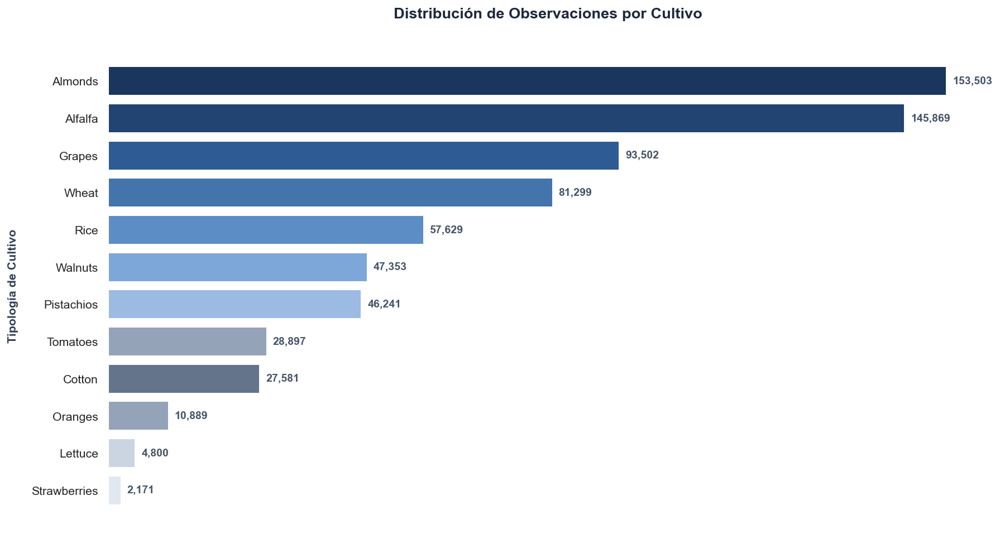

In [98]:
# Validamos qué cultivos quedaron y cuántas muestras tiene cada uno
check_cultivos = (
    df_imputed.group_by(["crop_id", "crop_name"])
    .agg(pl.count().alias("Total Muestras"))
    .sort("Total Muestras", descending=True)
)

with pl.Config(tbl_rows=-1):
    display(check_cultivos)

#Grafico 
# 1. Extraemos los datos actualizados y homologados desde tu DataFrame de Polars
crop_names = check_cultivos["crop_name"].to_list()
total_muestras = check_cultivos["Total Muestras"].to_list()

# 2. Configuración del estilo institucional (Fondo blanco impoluto, sin cuadrículas)
sns.set_theme(style="white")
fig, ax = plt.subplots(figsize=(13, 7))

# 3. PALETA ACADÉMICA DE AZULES Y GRISES (Gama de degradado neutro)
# Diseñada a medida: los cultivos dominantes usan azules académicos profundos,
# transitando hacia grises pizarra y ceniza suaves para las clases minoritarias.
colores_academicos = [
    "#1b365d",  # 1. Almonds (Azul Marino Institucional)
    "#224472",  # 2. Alfalfa
    "#2e5b94",  # 3. Grapes
    "#4374ac",  # 4. Wheat (Clase unificada)
    "#5c8dc5",  # 5. Rice
    "#7ca7d8",  # 6. Walnuts
    "#9cbbe3",  # 7. Pistachios (Transición a gris)
    "#94a3b8",  # 8. Tomatoes (Gris Pizarra Medio)
    "#64748b",  # 9. Cotton
    "#94a3b8",  # 10. Oranges
    "#cbd5e1",  # 11. Lettuce
    "#e2e8f0"   # 12. Strawberries (Gris Ceniza Claro)
]

# 4. Crear el gráfico de barras horizontales
barras = ax.barh(crop_names, total_muestras, color=colores_academicos, edgecolor='none', height=0.75)

# Invertir el eje Y para mantener el orden jerárquico descendente
ax.invert_yaxis()

# 5. Etiquetas de datos numéricos con formato editorial al final de cada barra
max_val = max(total_muestras)
for barra in barras:
    ancho = barra.get_width()
    ax.text(
        ancho + (max_val * 0.008),          # Margen sutil a la derecha del final de la barra
        barra.get_y() + barra.get_height() / 2, # Centrado vertical perfecto
        f'{int(ancho):,}',                  # Formato con separador de miles estándar
        va='center',
        ha='left',
        fontsize=10,
        fontweight='bold',
        color='#475569'                     # Texto en gris oscuro neutro en lugar de negro puro
    )

# 6. Personalización de Títulos y Ejes (Tipografías limpias)
ax.set_title("Distribución de Observaciones por Cultivo", fontsize=14, fontweight='bold', pad=25, color='#1e293b')
ax.set_ylabel("Tipología de Cultivo", fontsize=11, fontweight='semibold', labelpad=12, color='#334155')

# 7. Eliminación absoluta de elementos redundantes (Limpieza Cartesiana)
ax.grid(False)             # Sin cuadrícula
ax.set_xticks([])          # Sin marcas en el eje X
ax.set_xticklabels([])     # Sin números inferiores (redundantes por las etiquetas de las barras)

# Desactivar todos los bordes del recuadro para un look minimalista moderno
sns.despine(left=True, bottom=True)

# Ajuste automático de márgenes para evitar truncamiento en la exportación del PDF
plt.tight_layout()

# Le pasamos la figura actual (fig) y el nombre que queramos
save(fig, "02_distribucion_cultivos_limpios.png")

# Mostrar el gráfico inline en el Notebook
plt.show()

### Ubicación de los cultivos

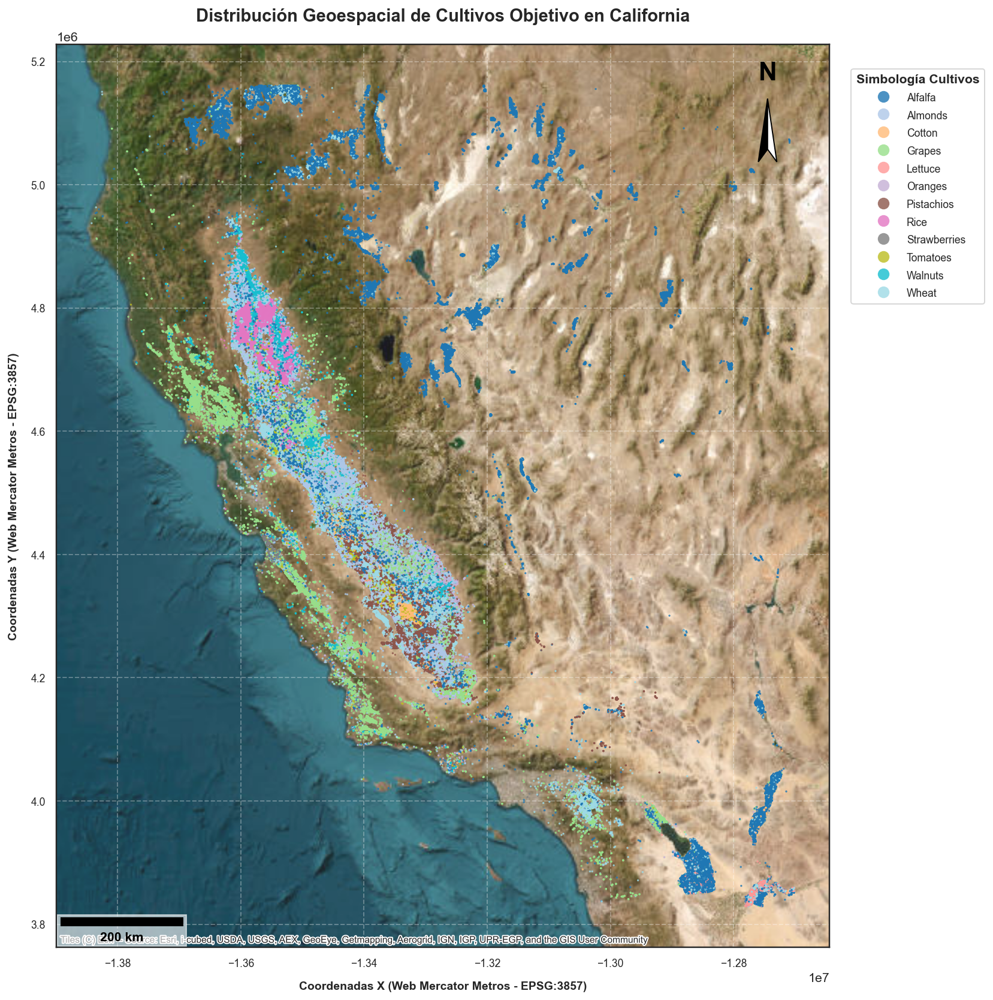

In [99]:
# ==============================================================================
# 1. PREPROCESAMIENTO GEOESPACIAL (Polars -> GeoPandas)
# ==============================================================================
# A. Desempaquetamos la columna struct 'location' de Polars para extraer Lon/Lat
# y lo convertimos temporalmente a Pandas para GeoPandas.

df_pandas = df_imputed.select([
    pl.col("location").struct.field("coordinates").list.get(0).alias("longitude"),
    pl.col("location").struct.field("coordinates").list.get(1).alias("latitude"),
    "crop_name"
]).to_pandas()

# B. Creamos la geometría de Shapely 'Points'
geometry = [Point(xy) for xy in zip(df_pandas.longitude, df_pandas.latitude)]

# C. Creamos el GeoDataFrame especificando el Sistema de Referencia de Coordenadas (CRS)
# El CRS inicial es WGS84 (Lat/Lon crudos) -> EPSG:4326
gdf = gpd.GeoDataFrame(df_pandas, geometry=geometry, crs="EPSG:4326")

# D. Reproyectamos a Web Mercator (EPSG:3857)
# Esto es vital para que las distancias, escalas y mapas base salgan perfectos.
gdf_projected = gdf.to_crs(epsg=3857)

# ==============================================================================
# 2. CONFIGURACIÓN DEL LIENZO Y MAPA BASE
# ==============================================================================
fig, ax = plt.subplots(figsize=(12, 16))

# Dibujamos los puntos agrupados por crop_name.
#  CORRECCIÓN: Cambiamos cmap='bright' por cmap='tab20' (Válido en Matplotlib)
gdf_projected.plot(
    ax=ax, 
    column='crop_name', 
    categorical=True, 
    legend=True, 
    markersize=3, 
    cmap='tab20',       # <- ¡Este sí lo reconoce perfectamente!
    alpha=0.8,
    edgecolor='none'
)

# Añadimos el Mapa Base Satelital
cx.add_basemap(ax, source=cx.providers.Esri.WorldImagery, alpha=0.9)

# ==============================================================================
# 3. ELEMENTOS CARTOGRÁFICOS SOLICITADOS (El toque profesional)
# ==============================================================================
# A. Coordenadas y Cuadrícula
# Las coordenadas se muestran en Web Mercator (metros), lo cual es lo correcto al proyectar.
# Formateamos ticks para limpieza
ax.tick_params(axis='both', which='major', labelsize=9)
ax.set_title("Distribución Geoespacial de Cultivos Objetivo en California", fontsize=15, fontweight='bold', pad=20)
ax.set_xlabel("Coordenadas X (Web Mercator Metros - EPSG:3857)", fontsize=10, labelpad=10)
ax.set_ylabel("Coordenadas Y (Web Mercator Metros - EPSG:3857)", fontsize=10, labelpad=10)
# Mostramos la grilla sutilmente
ax.grid(True, linestyle='--', alpha=0.3, color='white')

# B. Escala Gráfica Dinámica (Matplotlib-Scalebar)
# Es vital usar la escala de 1 pixel = 1 metro ya que reproyectamos a 3857.
scalebar = ScaleBar(
    1,                   # Unidades por pixel (1 pixel = 1 metro en EPSG:3857)
    "m",                 # Unidades de referencia
    length_fraction=0.20, # Longitud relativa de la barra (20% del mapa)
    location="lower left",# Posición
    font_properties={'size': 11, 'weight': 'bold'},
    box_color='white',   # Fondo blanco para legibilidad sobre satélite
    box_alpha=0.6,
    color='black'
)
ax.add_artist(scalebar)

# C. Brújula del Norte (North Arrow simple y elegante)
# Dibujamos una flecha blanca apuntando al Norte en la esquina superior derecha
x_n, y_n = 0.92, 0.94
ancho = 0.012  # Ancho de la base de la flecha
alto = 0.07    # Alto de la flecha

# Coordenadas de los vértices: [Punta superior, Esquina inferior, Centro base]
izq_verts = [[x_n, y_n], [x_n - ancho, y_n - alto], [x_n, y_n - alto * 0.8]]
der_verts = [[x_n, y_n], [x_n + ancho, y_n - alto], [x_n, y_n - alto * 0.8]]

# Dibujamos las dos mitades como polígonos anclados a los ejes
ax.add_patch(Polygon(izq_verts, facecolor='black', edgecolor='black', 
                     transform=ax.transAxes, zorder=5))
ax.add_patch(Polygon(der_verts, facecolor='white', edgecolor='black', 
                     transform=ax.transAxes, zorder=5))

# Añadimos la letra 'N' flotando justo arriba de la punta
ax.text(x_n, y_n + 0.015, 'N', ha='center', va='bottom', 
        fontsize=22, fontweight='bold', color='black', 
        transform=ax.transAxes, zorder=5)

# D. Leyenda o Simbología
# GeoPandas ya crea la leyenda dinámica, pero la movemos y formateamos
legend = ax.get_legend()
if legend:
    legend.set_title("Simbología Cultivos", prop={'size': 11, 'weight': 'bold'})
    legend.set_bbox_to_anchor((1.02, 0.98)) # Movemos la leyenda fuera del mapa a la derecha
    plt.setp(legend.get_texts(), fontsize='9') # Formateamos tamaño del texto

# E. Diseño final: Quitamos los márgenes blancos innecesarios
plt.tight_layout()

plt.savefig(os.path.join(OUTPUT_DIR, '03_mapa_cultivos_ca.png'), dpi=300, bbox_inches='tight')

plt.show()

# Añadir variable Condados al dataset

In [100]:
# Extraer lon/lat del struct GeoJSON de Polars
# Estructura: {"type": "Point", "coordinates": [lon, lat]}
df_imputed = df_imputed.with_columns([
    pl.col('location')
      .struct.field('coordinates')
      .list.get(0)
      .alias('lon'),
    pl.col('location')
      .struct.field('coordinates')
      .list.get(1)
      .alias('lat')
])

# Verificar que los valores tienen sentido para California
print("Rango de coordenadas:")
print(f"  lon: {df_imputed['lon'].min():.4f} a {df_imputed['lon'].max():.4f}")
print(f"  lat: {df_imputed['lat'].min():.4f} a {df_imputed['lat'].max():.4f}")

# Esperas ver algo como:
# lon: -124.xx a -114.xx  (California está entre -124 y -114)
# lat:   32.xx a   42.xx  (California está entre 32 y 42)

Rango de coordenadas:
  lon: -124.3469 a -114.1000
  lat: 32.5004 a 42.0000


ddd

In [101]:
# ── Opción 1: Census TIGER directo (más confiable) ──
url_tiger = (
    "https://www2.census.gov/geo/tiger/TIGER2022/COUNTY/"
    "tl_2022_us_county.zip"
)

print("Descargando shapefile Census TIGER...")
response = requests.get(url_tiger, timeout=60)
z = zipfile.ZipFile(io.BytesIO(response.content))
z.extractall("/tmp/tiger_counties")

gdf_us_counties = gpd.read_file("/tmp/tiger_counties/tl_2022_us_county.shp")

# Filtrar solo California (FIPS code = '06')
gdf_counties_tiger = gdf_us_counties[
    gdf_us_counties['STATEFP'] == '06'
].copy()

print(f"Condados de California: {len(gdf_counties_tiger)}")
print(f"CRS: {gdf_counties_tiger.crs}")

# Renombrar columna de nombre para mantener compatibilidad
# con el resto del código que usa 'name'
gdf_counties_tiger = gdf_counties_tiger.rename(
    columns={'NAME': 'name'}
)

# Verificar que tiene los 58 condados
print(f"\nCondados incluidos: {sorted(gdf_counties_tiger['name'].tolist())}")

Descargando shapefile Census TIGER...
Condados de California: 58
CRS: EPSG:4269

Condados incluidos: ['Alameda', 'Alpine', 'Amador', 'Butte', 'Calaveras', 'Colusa', 'Contra Costa', 'Del Norte', 'El Dorado', 'Fresno', 'Glenn', 'Humboldt', 'Imperial', 'Inyo', 'Kern', 'Kings', 'Lake', 'Lassen', 'Los Angeles', 'Madera', 'Marin', 'Mariposa', 'Mendocino', 'Merced', 'Modoc', 'Mono', 'Monterey', 'Napa', 'Nevada', 'Orange', 'Placer', 'Plumas', 'Riverside', 'Sacramento', 'San Benito', 'San Bernardino', 'San Diego', 'San Francisco', 'San Joaquin', 'San Luis Obispo', 'San Mateo', 'Santa Barbara', 'Santa Clara', 'Santa Cruz', 'Shasta', 'Sierra', 'Siskiyou', 'Solano', 'Sonoma', 'Stanislaus', 'Sutter', 'Tehama', 'Trinity', 'Tulare', 'Tuolumne', 'Ventura', 'Yolo', 'Yuba']


In [102]:
# Coordenadas únicas para el spatial join
coords_unicas = (
    df_imputed
    .select(['lon', 'lat'])
    .unique()
    .to_pandas()
)

print(f"Puntos geográficos únicos: {len(coords_unicas):,}")

# Convertir a GeoDataFrame — CRS es EPSG:4326 (grados decimales)
gdf_parcelas = gpd.GeoDataFrame(
    coords_unicas,
    geometry=gpd.points_from_xy(coords_unicas['lon'], coords_unicas['lat']),
    crs='EPSG:4326'  # ya están en grados decimales, no necesita reproyección
)

# Cargar condados — también en EPSG:4326 por defecto
url_counties = (
    "https://raw.githubusercontent.com/codeforgermany/"
    "click_that_hood/main/public/data/california-counties.geojson"
)
gdf_counties = gpd.read_file(url_counties).to_crs('EPSG:4326')

Puntos geográficos únicos: 633,904


c:\Users\lesli\Documents\TFM\venv\Lib\site-packages\geopandas\io\file.py:399: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  as_dt = pd.to_datetime(df[k], errors="ignore")
c:\Users\lesli\Documents\TFM\venv\Lib\site-packages\geopandas\io\file.py:399: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  as_dt = pd.to_datetime(df[k], errors="ignore")


In [103]:
# ── Re-ejecutar el spatial join con el nuevo shapefile ──
coords_unicas = (
    df_imputed
    .select(['lon', 'lat'])
    .unique()
    .to_pandas()
)

gdf_parcelas = gpd.GeoDataFrame(
    coords_unicas,
    geometry=gpd.points_from_xy(coords_unicas['lon'], coords_unicas['lat']),
    crs='EPSG:4326'
)

# Spatial join con el shapefile completo
gdf_joined = gpd.sjoin(
    gdf_parcelas,
    gdf_counties[['name', 'geometry']],
    how='left',
    predicate='within'
)

# Fallback para bordes
mask_sin = gdf_joined['name'].isna()
print(f"Parcelas sin condado (within): {mask_sin.sum():,}")

if mask_sin.sum() > 0:
    gdf_sin = gdf_parcelas[mask_sin.values].copy()
    gdf_nearest = gpd.sjoin_nearest(
        gdf_sin,
        gdf_counties[['name', 'geometry']],
        how='left'
    )
    gdf_nearest_dedup = (
        gdf_nearest
        .reset_index()
        .drop_duplicates(subset=['index'])
        .set_index('index')
    )
    gdf_joined.loc[mask_sin, 'name'] = gdf_nearest_dedup['name']
    print(f"Recuperadas con sjoin_nearest: {mask_sin.sum():,}")

print(f"Condados únicos asignados: {gdf_joined['name'].nunique()}")
print(f"Parcelas sin condado final: {gdf_joined['name'].isna().sum():,}")

Parcelas sin condado (within): 39,741


c:\Users\lesli\Documents\TFM\venv\Lib\site-packages\geopandas\array.py:365: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(


Recuperadas con sjoin_nearest: 39,741
Condados únicos asignados: 57
Parcelas sin condado final: 0


In [104]:
# ── Actualizar columna county en df_imputed ──
county_map = dict(zip(
    zip(gdf_joined['lon'], gdf_joined['lat']),
    gdf_joined['name'].values
))

df_imputed = df_imputed.with_columns(
    pl.struct(['lon', 'lat'])
    .map_elements(
        lambda s: county_map.get((s['lon'], s['lat']), 'Unknown'),
        return_dtype=pl.String
    )
    .alias('county')
)

# Verificar mejora en cobertura
print("\nTop 20 condados por parcelas (ahora con cobertura completa):")
print(
    df_imputed
    .group_by('county')
    .len()
    .sort('len', descending=True)
    .head(20)
)


Top 20 condados por parcelas (ahora con cobertura completa):
shape: (20, 2)
┌─────────────┬───────┐
│ county      ┆ len   │
│ ---         ┆ ---   │
│ str         ┆ u32   │
╞═════════════╪═══════╡
│ Fresno      ┆ 96679 │
│ Kern        ┆ 67206 │
│ Tulare      ┆ 52370 │
│ Merced      ┆ 44410 │
│ San Joaquin ┆ 42236 │
│ …           ┆ …     │
│ Mono        ┆ 12304 │
│ Modoc       ┆ 11639 │
│ Lassen      ┆ 10810 │
│ Siskiyou    ┆ 10758 │
│ Solano      ┆ 9960  │
└─────────────┴───────┘


In [105]:
# ─────────────────────────────────────────────────────────
# FUNCIÓN: Flecha de norte mitad negra / mitad blanca
# ─────────────────────────────────────────────────────────

def agregar_norte(ax, x=0.95, y=0.97, size=0.045):
    """
    Añade una flecha de norte estilo cartográfico (mitad negra, mitad blanca)
    en coordenadas de ejes (0-1).

    Parámetros
    ----------
    ax   : eje de matplotlib
    x, y : posición del centro de la flecha (coordenadas de figura, 0-1)
    size : tamaño relativo de la flecha
    """
    fig = ax.get_figure()
    ax_bbox = ax.get_position()

    # Convertir coordenadas relativas al eje en coordenadas de figura
    cx = ax_bbox.x0 + x * ax_bbox.width
    cy = ax_bbox.y0 + y * ax_bbox.height

    h  = size * 1.8   # altura de la flecha
    w  = size * 0.55  # semi-ancho de la base

    # Mitad izquierda (negra)
    tri_izq = plt.Polygon(
        [[cx - w, cy - h * 0.55],
         [cx,     cy + h * 0.45],
         [cx,     cy - h * 0.55]],
        transform=fig.transFigure,
        color='black', zorder=10, clip_on=False
    )

    # Mitad derecha (blanca con borde negro)
    tri_der = plt.Polygon(
        [[cx,     cy - h * 0.55],
         [cx,     cy + h * 0.45],
         [cx + w, cy - h * 0.55]],
        transform=fig.transFigure,
        color='white', zorder=10, clip_on=False,
        ec='black', linewidth=0.8
    )

    # Contorno exterior de la flecha completa
    contorno = plt.Polygon(
        [[cx - w, cy - h * 0.55],
         [cx,     cy + h * 0.45],
         [cx + w, cy - h * 0.55]],
        transform=fig.transFigure,
        fill=False, ec='black', linewidth=1.0,
        zorder=11, clip_on=False
    )

    fig.add_artist(tri_izq)
    fig.add_artist(tri_der)
    fig.add_artist(contorno)

    # Letra N
    fig.text(
        cx, cy + h * 0.52,
        'N',
        transform=fig.transFigure,
        ha='center', va='bottom',
        fontsize=11, fontweight='bold',
        color='black', zorder=12,
        path_effects=[pe.withStroke(linewidth=2, foreground='white')]
    )


# ─────────────────────────────────────────────────────────
# DATOS (se asume que df_imputed y gdf_counties ya existen
# en el entorno del notebook; este script es autocontenido
# para pruebas — adaptar rutas si se ejecuta standalone)
# ─────────────────────────────────────────────────────────

cultivos_colores = {
    'Alfalfa':      '#1f77b4',
    'Almonds':      '#aec7e8',
    'Cotton':       '#ff7f0e',
    'Grapes':       '#2ca02c',
    'Lettuce':      '#98df8a',
    'Oranges':      '#d62728',
    'Pistachios':   '#ff9896',
    'Rice':         '#9467bd',
    'Strawberries': '#c5b0d5',
    'Tomatoes':     '#8c564b',
    'Walnuts':      '#c49c94',
    'Wheat':        '#bcbd22'
}


# En la función mapa_cultivos reemplaza el bloque de plotting por este:

def mapa_cultivos(df_imputed, gdf_counties, ruta_salida='mapa_cultivos_condados.png'):
    

    # Muestra para el scatter
    df_sample = (
        df_imputed
        .select(['lon', 'lat', 'crop_name'])
        .to_pandas()
        .sample(n=min(60_000, len(df_imputed)), random_state=42)
    )

    fig, ax = plt.subplots(figsize=(12, 14))

    # ── 1. Contorno de California como fondo (unión de todos los condados) ──
    # Reparar geometrías inválidas antes de la unión
    gdf_counties_fixed = gdf_counties.copy()
    gdf_counties_fixed['geometry'] = gdf_counties_fixed.geometry.buffer(0)
    california = gdf_counties_fixed.unary_union
    gdf_ca = gpd.GeoDataFrame(geometry=[california], crs=gdf_counties.crs)
    gdf_ca.plot(
        ax=ax,
        facecolor='#f7f4ef',
        edgecolor='none',
        zorder=0
    )

    # ── 2. Relleno y bordes de condados ──
    gdf_counties.plot(
        ax=ax,
        facecolor='#f7f4ef',
        edgecolor='#666666',
        linewidth=0.5,
        zorder=1
    )

    # ── 3. Borde exterior del estado más grueso ──
    gdf_ca.boundary.plot(
        ax=ax,
        edgecolor='#222222',
        linewidth=1.2,
        zorder=2
    )

    # ── 4. Clip: limitar scatter al territorio de California ──
    from shapely.geometry import Point
    import pandas as pd

    # Añadir geometría al sample para hacer clip espacial
    gdf_sample = gpd.GeoDataFrame(
        df_sample,
        geometry=gpd.points_from_xy(df_sample['lon'], df_sample['lat']),
        crs='EPSG:4326'
    )
    # Clip contra el polígono de California
    gdf_sample_clip = gpd.clip(gdf_sample, gdf_ca)

    # ── 5. Scatter por cultivo (solo puntos dentro de California) ──
    for cultivo, color in cultivos_colores.items():
        mask = gdf_sample_clip['crop_name'] == cultivo
        if mask.sum() > 0:
            ax.scatter(
                gdf_sample_clip.loc[mask, 'lon'],
                gdf_sample_clip.loc[mask, 'lat'],
                c=color, s=1.0, alpha=0.55,
                label=cultivo, zorder=3,
                rasterized=True
            )

    # ── 6. Etiquetas de condado ──
    for _, row in gdf_counties.iterrows():
        centroid = row['geometry'].centroid
        ax.annotate(
            row['name'],
            xy=(centroid.x, centroid.y),
            fontsize=4.8, ha='center', va='center',
            color='#333333', zorder=4,
            path_effects=[pe.withStroke(linewidth=1.5, foreground='white')]
        )

    # ── 7. Leyenda ──
    ax.legend(
        markerscale=7, loc='lower right',
        fontsize=8.5, title='Cultivos',
        title_fontsize=9,
        framealpha=0.92,
        edgecolor='#cccccc'
    )

    ax.set_title(
        'Distribución Geoespacial de Cultivos por Condado\nCalifornia, 2008–2025',
        fontsize=13, pad=12
    )
    ax.set_xlabel('Longitud (°)', fontsize=10)
    ax.set_ylabel('Latitud (°)', fontsize=10)
    ax.grid(True, alpha=0.25, zorder=0)
    ax.set_xlim(-124.6, -113.9)  
    ax.set_ylim(32.4, 42.1)

    # ── 8. Norte en esquina superior derecha ──
    agregar_norte(ax, x=0.96, y=0.97)

    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, ruta_salida), dpi=300, bbox_inches='tight')
    plt.show()
    print(f'Mapa guardado: {ruta_salida}')


def mapa_densidad(df_imputed, gdf_counties, ruta_salida='mapa_densidad_condados.png'):
    """
    Choropleth de densidad de parcelas por condado.
    """
   

    # Densidad por condado
    densidad_pd = (
        df_imputed
        .group_by('county')
        .len()
        .sort('len', descending=True)
        .to_pandas()
        .rename(columns={'len': 'n_parcelas'})
    )

    gdf_density = gdf_counties.merge(
        densidad_pd,
        left_on='name', right_on='county',
        how='left'
    )
    gdf_density['n_parcelas'] = gdf_density['n_parcelas'].fillna(0)

    fig, ax = plt.subplots(figsize=(12, 14))

    gdf_density.plot(
        column='n_parcelas',
        ax=ax,
        cmap='YlOrRd',
        legend=True,
        legend_kwds={
            'label':       'Número de parcelas',
            'orientation': 'vertical',
            'shrink':      0.45,
            'pad':         0.02
        },
        edgecolor='#333333',
        linewidth=0.5,
        missing_kwds={'color': '#f0f0f0'},
        zorder=2
    )

    # Etiquetas: nombre + cantidad
    for _, row in gdf_density.iterrows():
        if row['n_parcelas'] > 0:
            centroid = row['geometry'].centroid
            ax.annotate(
                f"{row['name']}\n{int(row['n_parcelas']):,}",
                xy=(centroid.x, centroid.y),
                fontsize=4.5, ha='center', va='center',
                color='black', zorder=5,
                path_effects=[pe.withStroke(linewidth=1.5, foreground='white')]
            )

    ax.set_title(
        'Densidad de Parcelas Agrícolas por Condado\nCalifornia, 2008–2025',
        fontsize=13, pad=12
    )
    ax.set_xlabel('Longitud (°)', fontsize=10)
    ax.set_ylabel('Latitud (°)', fontsize=10)
    ax.grid(True, alpha=0.25, zorder=0)
    ax.set_xlim(-124.6, -113.9) 
    ax.set_ylim(32.4, 42.1)

    # Flecha de norte
    agregar_norte(ax, x=0.96, y=0.97)

    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, ruta_salida), dpi=300, bbox_inches='tight')
    plt.show()
    print(f'Mapa guardado: {ruta_salida}')


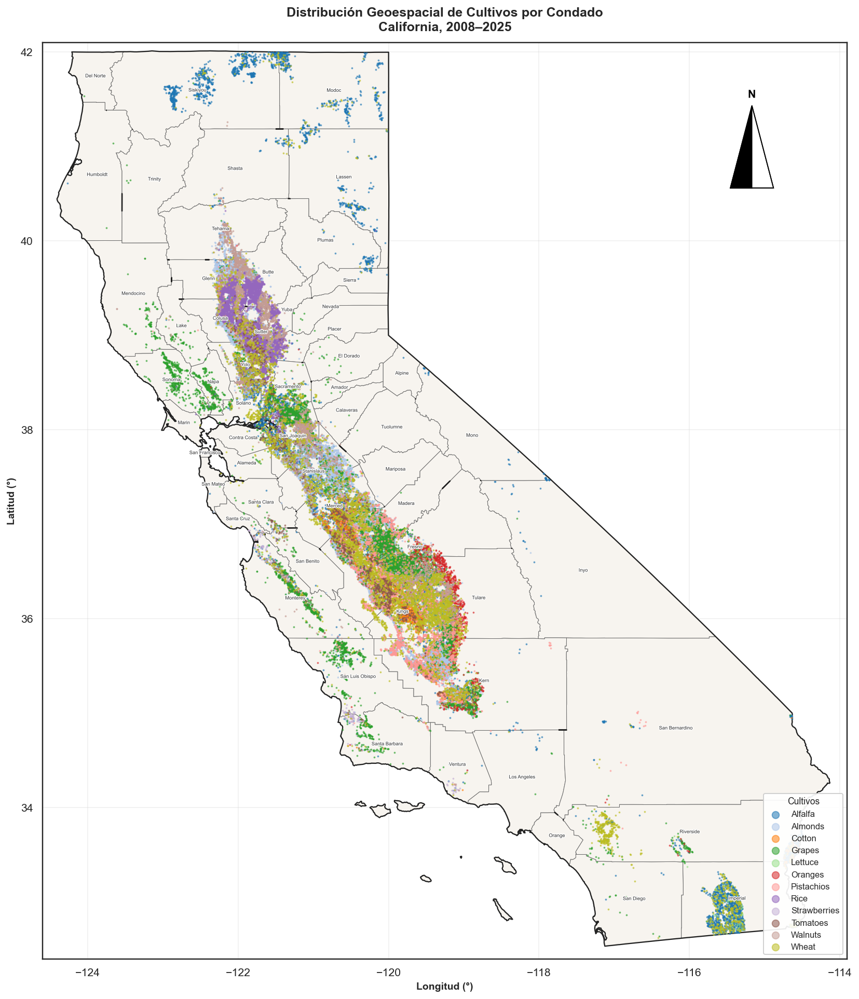

Mapa guardado: 04_mapa_condados_cultivos.png


In [106]:
# Mapa 1: distribución de cultivos
mapa_cultivos(
    df_imputed, 
    gdf_counties,
    ruta_salida='04_mapa_condados_cultivos.png'
)
plt.show()



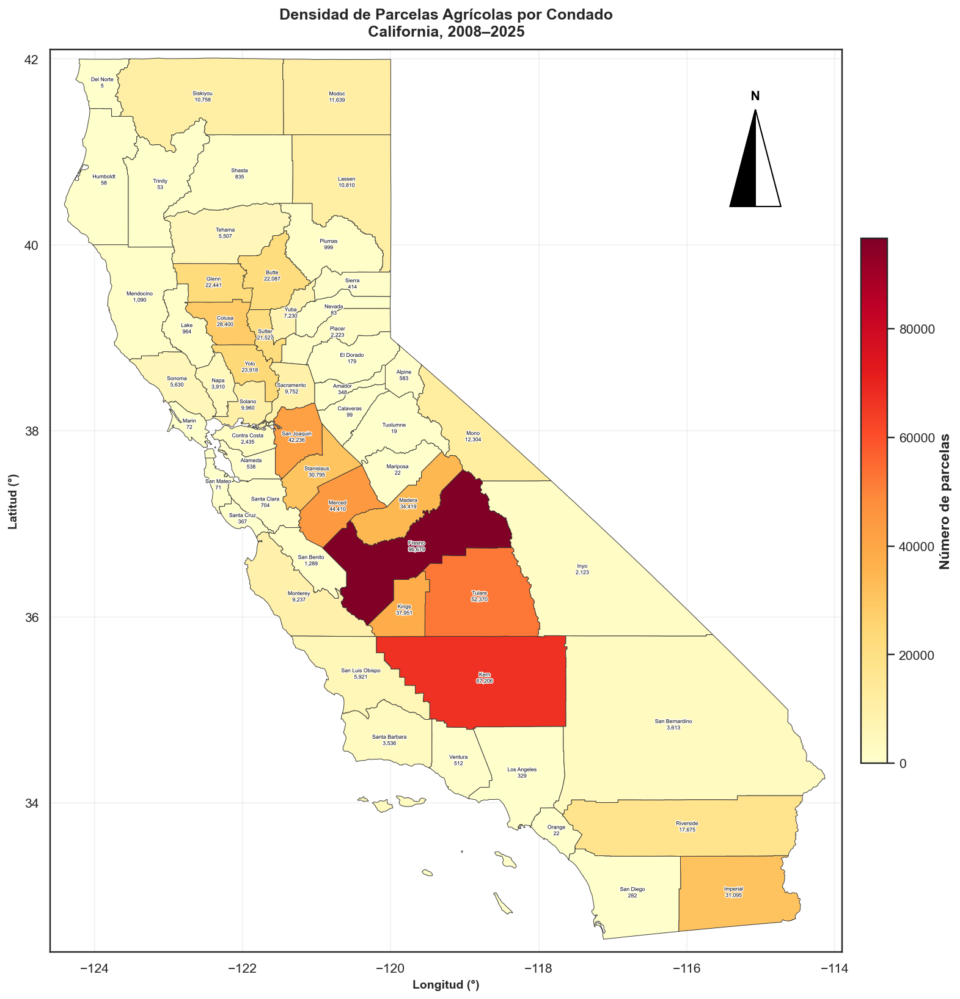

Mapa guardado: 05_mapa_densidad_condados.png


In [107]:
# Mapa 2: choropleth de densidad
mapa_densidad(
    df_imputed,
    gdf_counties,
    ruta_salida='05_mapa_densidad_condados.png'
)
plt.show()

In [108]:
# 1. Separar histórico y futuro 
HIST_YEARS = list(range(2008, 2026))
FUT_YEARS  = [2030, 2040]

df_hist = df_imputed.filter(pl.col('year').is_in(HIST_YEARS))
df_fut = df_imputed.filter(pl.col('year').is_in(FUT_YEARS))

In [109]:
# Confirmar que la diferencia corresponde exactamente a las proyecciones
print(f"Total df raw:      {df_raw.height:,}")
print(f"Total df cultios filtrados:      {df2.height:,}")
print(f"Total df limpio:   {df_imputed.height:,}")
print(f"Total df histórico: {df_hist.height:,}")
print(f"Total df futuro:      {df_fut.height:,}")

Total df raw:      1,109,452
Total df cultios filtrados:      706,694
Total df limpio:   699,734
Total df histórico: 633,904
Total df futuro:      65,830


# Análisis temporal

C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\1086898898.py:5: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  .agg(pl.count().alias("Muestras"))


  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\06_evolucion_temporal_muestras.png


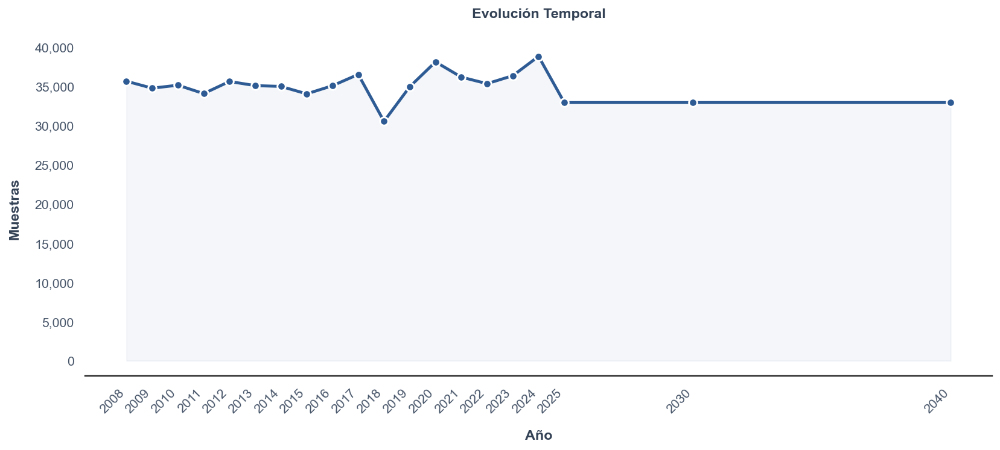

In [110]:
#Distribución de observaciones por Año

year_counts = (
    df_imputed.group_by("year")
    .agg(pl.count().alias("Muestras"))
    .sort("year")
)

años = year_counts["year"].to_list()
muestras = year_counts["Muestras"].to_list()

fig, ax = plot_linea_tfm(años, muestras, "Evolución Temporal", "Año", "Muestras")

save(fig, "06_evolucion_temporal_muestras.png")
plt.show()

C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\544452232.py:4: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  .agg(pl.count().alias("cantidad"))


  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_grapes.png


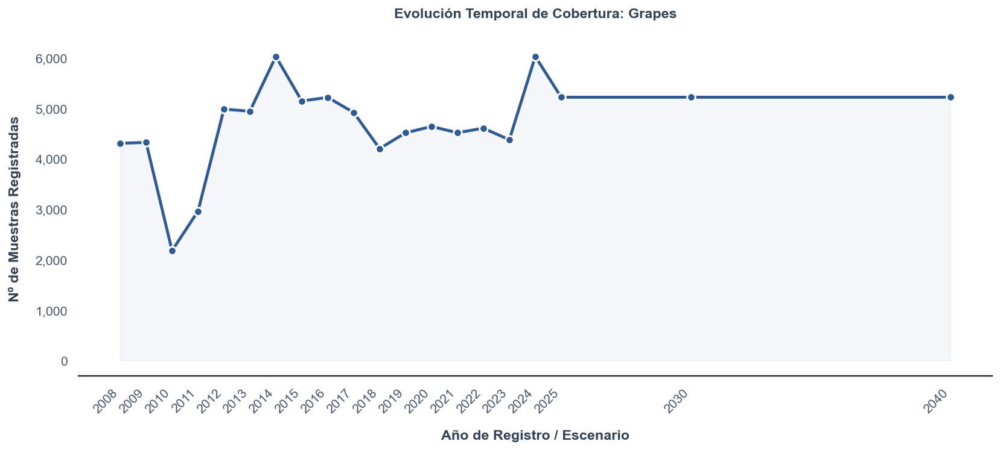

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_alfalfa.png


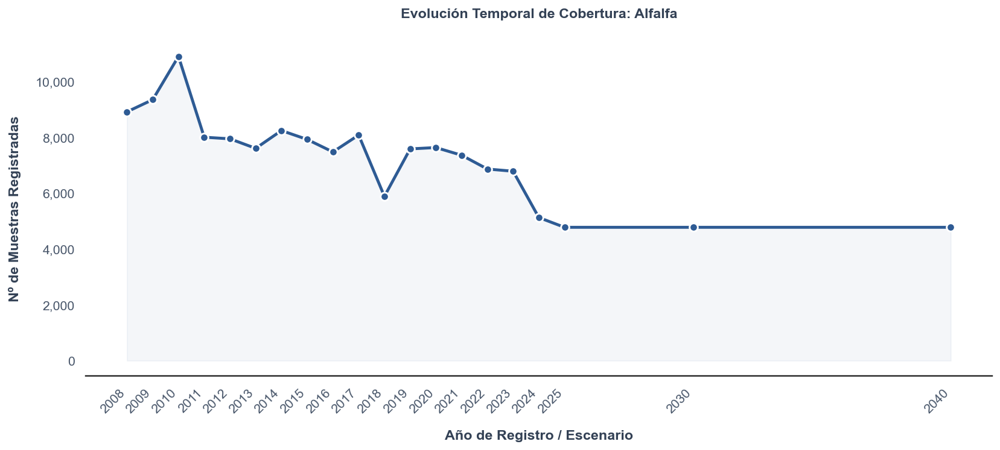

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_strawberries.png


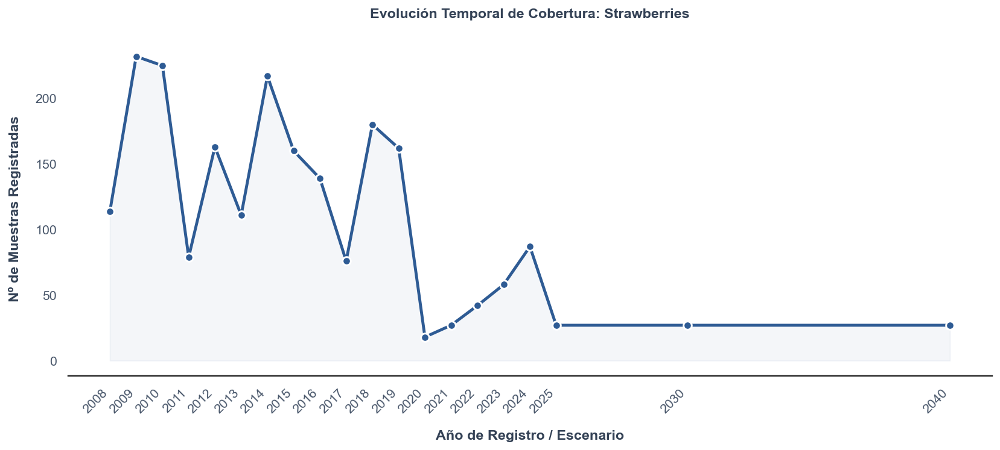

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_cotton.png


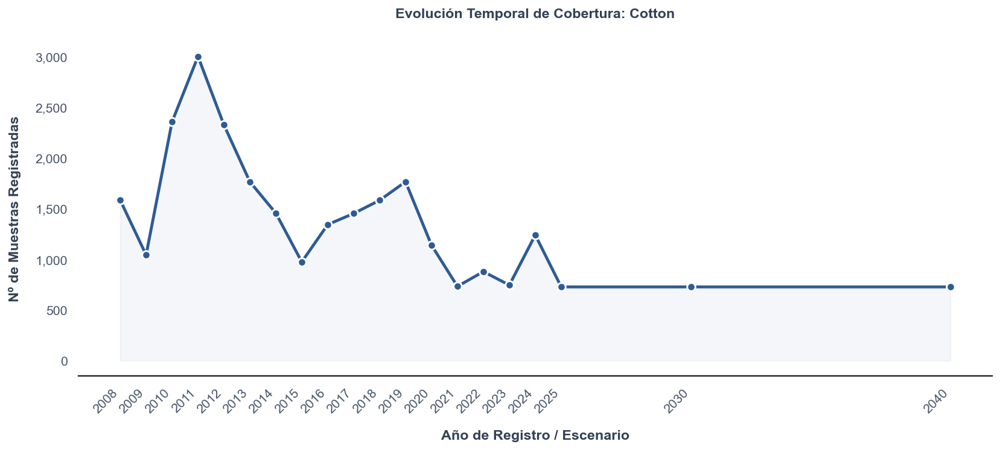

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_walnuts.png


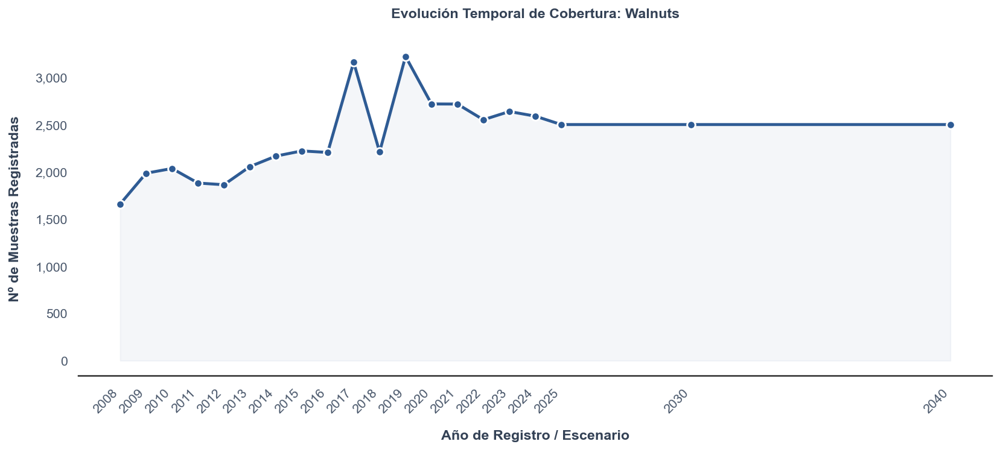

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_oranges.png


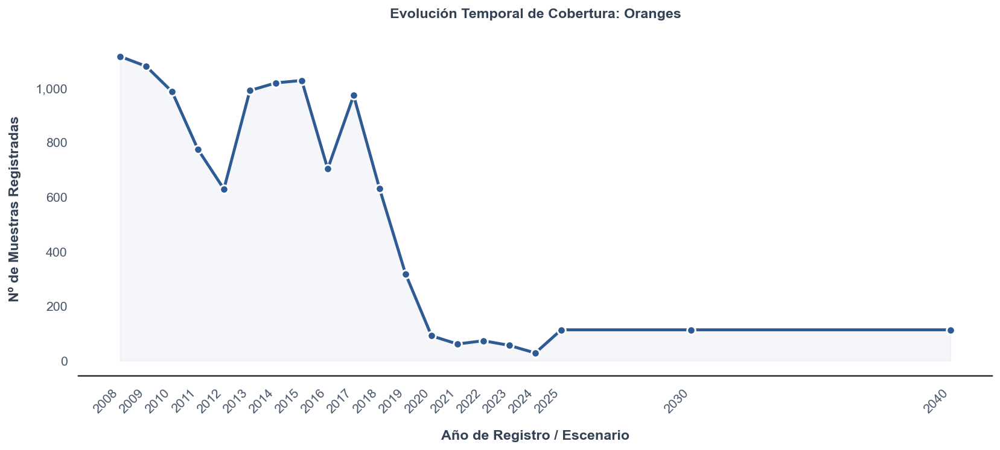

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_lettuce.png


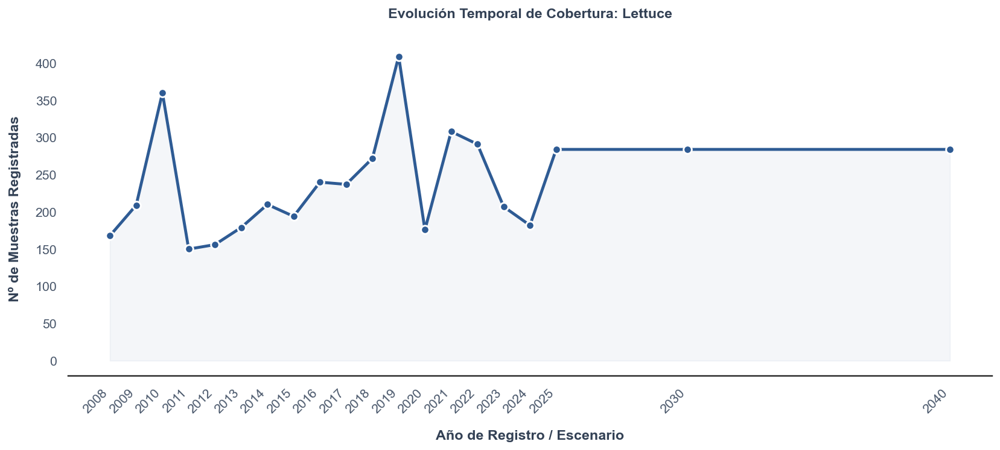

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_almonds.png


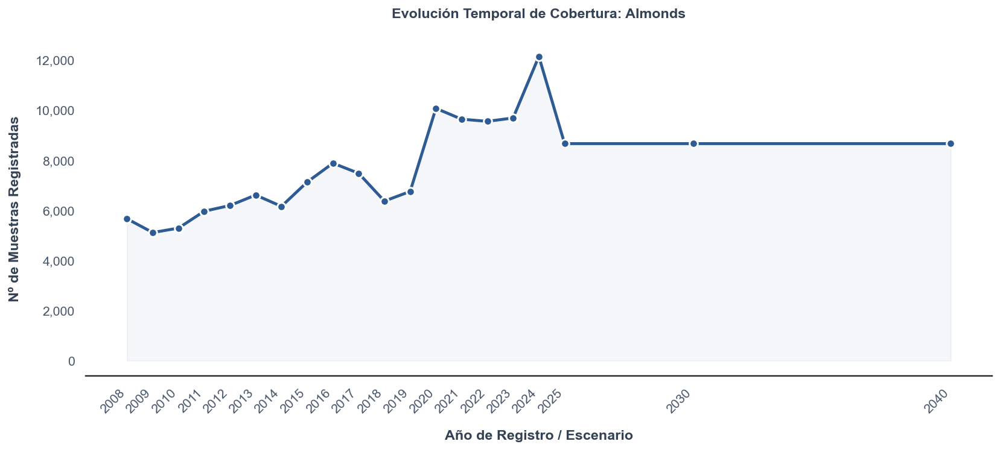

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_wheat.png


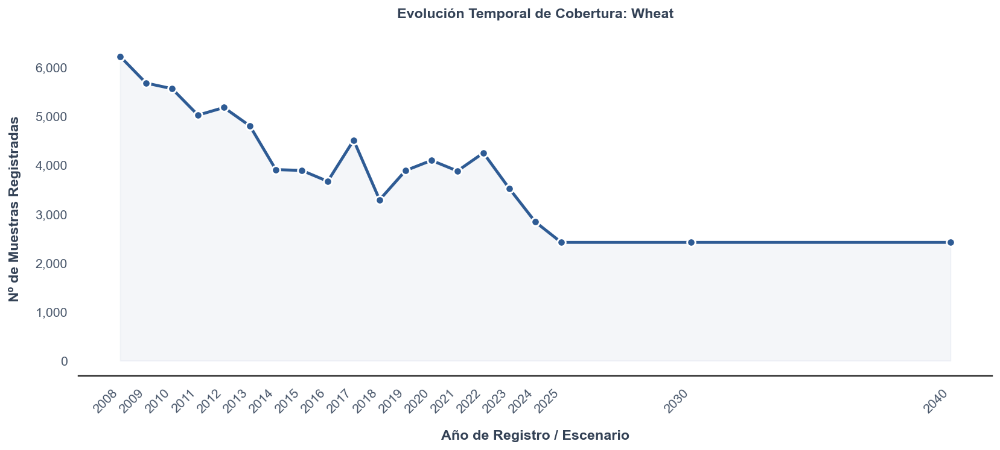

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_pistachios.png


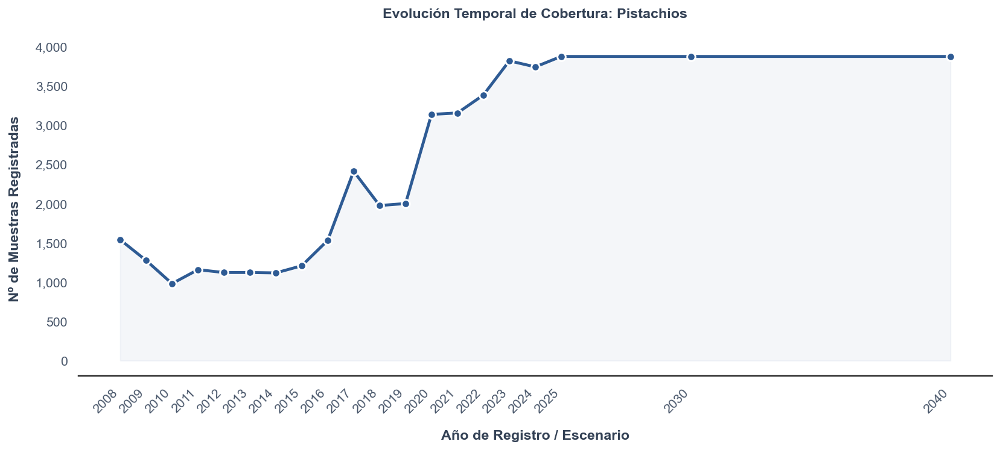

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_tomatoes.png


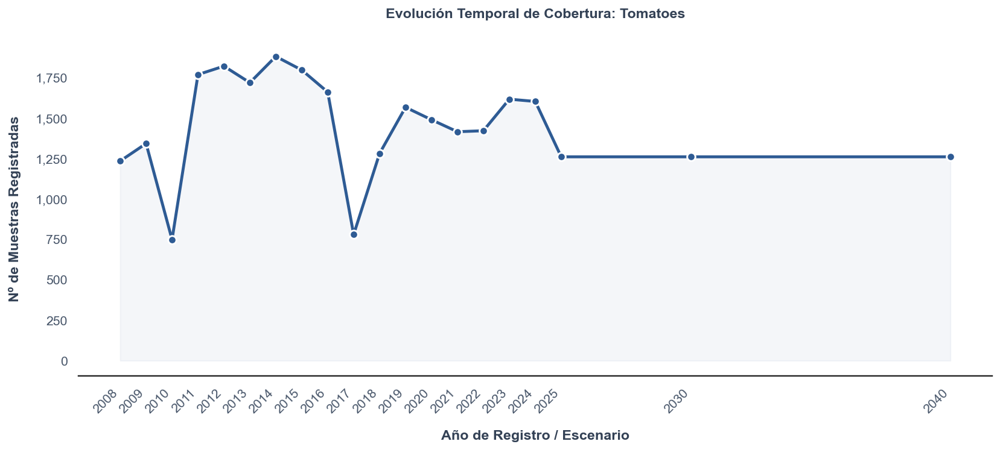

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\07_evolucion_cobertura_rice.png


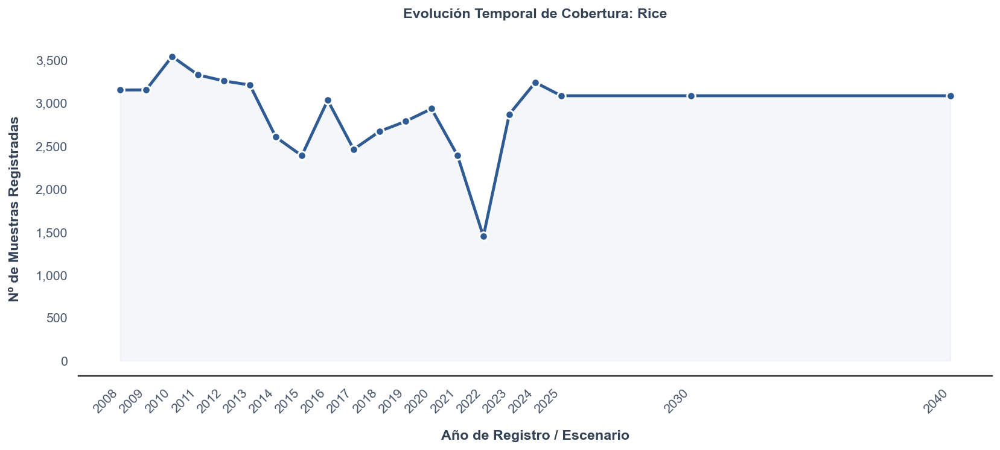

In [111]:
# Agrupar por año y cultivo para calcular las frecuencias temporales
df_evolucion = (
    df_imputed.group_by(["year", "crop_name"])
    .agg(pl.count().alias("cantidad"))
    .sort(["crop_name", "year"])
)

# Obtener la lista única de cultivos 
lista_cultivos = [c for c in df_evolucion["crop_name"].unique().to_list()]

# Bucle automatizado utilizando la función unificada del TFM
for cultivo in lista_cultivos:
    
    # Filtrar los datos específicos del cultivo actual
    df_crop = df_evolucion.filter(pl.col("crop_name") == cultivo)
    
    # Extraer los ejes a listas nativas para el motor gráfico
    anos = df_crop["year"].to_list()
    cantidades = df_crop["cantidad"].to_list()
    
    # Si por alguna razón el cultivo no tiene datos en este subset, saltamos la iteración
    if len(cantidades) == 0:
        continue
        
    # LLAMADA A LA FUNCIÓN CENTRALIZADA
 
    titulo_grafico = f"Evolución Temporal de Cobertura: {cultivo}"
    fig, ax = plot_linea_tfm(
        x=anos, 
        y=cantidades, 
        titulo=titulo_grafico, 
        xlabel="Año de Registro / Escenario", 
        ylabel="Nº de Muestras Registradas"
    )
    
    
    #Guardar imagen
    nombre_img = f"07_evolucion_cobertura_{cultivo.lower().replace(' ', '_')}.png"
    save(fig, nombre_img)
    
    # Desplegar en el Notebook
    plt.show()

# Varibles de Clima

In [112]:
# 1. Separar histórico y futuro PRIMERO (antes de eliminar nulos)
HIST_YEARS = list(range(2008, 2026))
FUT_YEARS  = [2030, 2040]

df_hist = df_imputed.filter(pl.col('year').is_in(HIST_YEARS))
df_fut = df_imputed.filter(pl.col('year').is_in(FUT_YEARS))

# 3. Reporte de dimensiones
print(f"Dataset original imputed: {df_imputed.height:>10,} filas x {df_imputed.width} columnas")
print(f"Histórico limpio 2008-25: {df_hist.height:>10,} filas")
print(f"Futuro intacto 2030/2040: {df_fut.height:>10,} filas")
print(f"Cultivos únicos         : {df_hist['crop_name'].n_unique()}")
print(f"Años históricos         : {sorted(df_hist['year'].unique().to_list())}")

Dataset original imputed:    699,734 filas x 44 columnas
Histórico limpio 2008-25:    633,904 filas
Futuro intacto 2030/2040:     65,830 filas
Cultivos únicos         : 12
Años históricos         : [2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025]


  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\08_mapa_temperatura_media.png


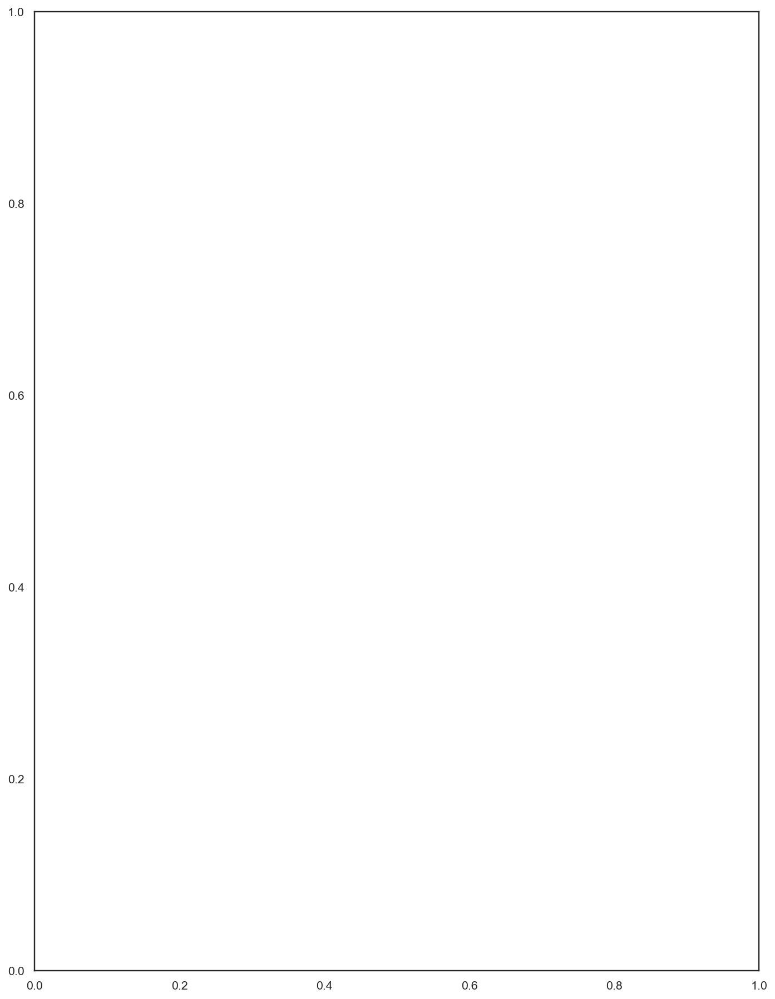

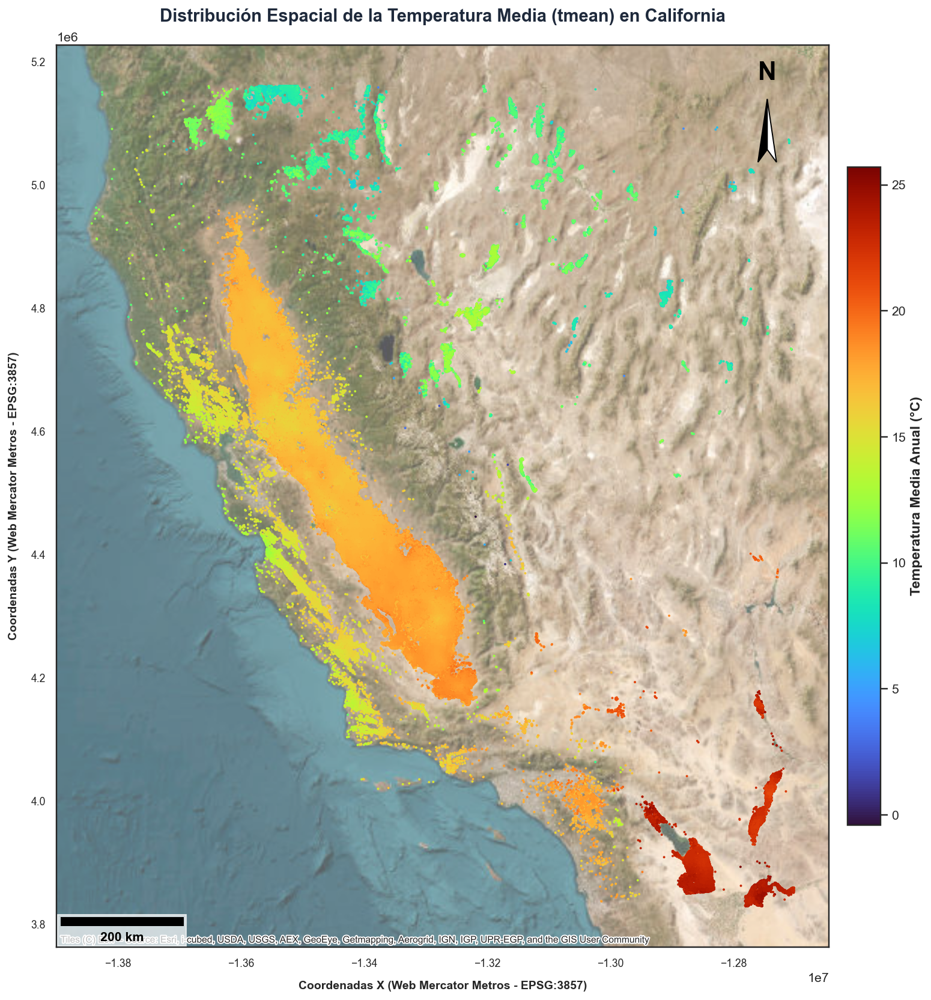

In [113]:
df_pandas = df_hist.select([
    pl.col("location").struct.field("coordinates").list.get(0).alias("longitude"),
    pl.col("location").struct.field("coordinates").list.get(1).alias("latitude"),
    "tmean"  # 
]).to_pandas()

# Creamos la geometría y el GeoDataFrame
geometry = [Point(xy) for xy in zip(df_pandas.longitude, df_pandas.latitude)]
gdf = gpd.GeoDataFrame(df_pandas, geometry=geometry, crs="EPSG:4326")
gdf_projected = gdf.to_crs(epsg=3857)
fig, ax = plt.subplots(figsize=(12, 16))

# Dibujamos los puntos. Al ser una variable continua, usamos un 'cmap' térmico.
# legend_kwds nos permite controlar el tamaño y etiqueta de la barra de color lateral.

fig, ax = plt.subplots(figsize=(12, 16))

# 1. Ajuste de puntos: Colores vibrantes ('turbo'), sin opacidad, tamaño ligeramente mayor
gdf_projected.plot(
    ax=ax, 
    column='tmean', 
    cmap='turbo',          #  Paleta ultra-vibrante: Azul profundo -> Cian -> Amarillo -> Rojo
    legend=True, 
    legend_kwds={
        'label': 'Temperatura Media Anual (°C)',
        'shrink': 0.5,
        'pad': 0.02
    },
    markersize=4,          # Ligeramente más grandes para crear una superficie más continua
    alpha=1.0,             # Cero transparencia en los datos para que no se laven
    edgecolor='none',
    zorder=2               # Aseguramos que los puntos queden por encima de todo
)

# 2. Ajuste del satélite: Lo oscurecemos sutilmente para que los datos "brillen"
cx.add_basemap(
    ax, 
    source=cx.providers.Esri.WorldImagery, 
    alpha=0.65,            # Oscurecemos el satélite (antes estaba en 0.9)
    zorder=1
)

# ==============================================================================
# 3. ELEMENTOS CARTOGRÁFICOS
# ==============================================================================

# A. Títulos y Coordenadas
ax.tick_params(axis='both', which='major', labelsize=9)
ax.set_title("Distribución Espacial de la Temperatura Media (tmean) en California", 
             fontsize=15, fontweight='bold', pad=20, color='#1e293b')
ax.set_xlabel("Coordenadas X (Web Mercator Metros - EPSG:3857)", fontsize=10, labelpad=10)
ax.set_ylabel("Coordenadas Y (Web Mercator Metros - EPSG:3857)", fontsize=10, labelpad=10)
ax.grid(True, linestyle='--', alpha=0.3, color='white')

# B. Escala Gráfica Dinámica
scalebar = ScaleBar(
    1, "m", 
    length_fraction=0.20, 
    location="lower left",
    font_properties={'size': 11, 'weight': 'bold'},
    box_color='white', box_alpha=0.7, color='black'
)
ax.add_artist(scalebar)

# ==============================================================================
# C. BRÚJULA DEL NORTE: DISEÑO CLÁSICO (Mitad negra / Mitad blanca)
# ==============================================================================
# Posición relativa en el gráfico (esquina superior derecha)
x_n, y_n = 0.92, 0.94
ancho = 0.012  # Ancho de la base de la flecha
alto = 0.07    # Alto de la flecha

# Coordenadas de los vértices: [Punta superior, Esquina inferior, Centro base]
izq_verts = [[x_n, y_n], [x_n - ancho, y_n - alto], [x_n, y_n - alto * 0.8]]
der_verts = [[x_n, y_n], [x_n + ancho, y_n - alto], [x_n, y_n - alto * 0.8]]

# Dibujamos las dos mitades como polígonos anclados a los ejes
ax.add_patch(Polygon(izq_verts, facecolor='black', edgecolor='black', 
                     transform=ax.transAxes, zorder=5))
ax.add_patch(Polygon(der_verts, facecolor='white', edgecolor='black', 
                     transform=ax.transAxes, zorder=5))

# Añadimos la letra 'N' flotando justo arriba de la punta
ax.text(x_n, y_n + 0.015, 'N', ha='center', va='bottom', 
        fontsize=22, fontweight='bold', color='black', 
        transform=ax.transAxes, zorder=5)

# ==============================================================================
# 4. EXPORTACIÓN Y RENDERIZADO
# ==============================================================================
plt.tight_layout()

# Descomenta esta línea si quieres guardar el mapa usando tu función automatizada
save(fig, "08_mapa_temperatura_media.png")

plt.show()

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\09_mapa_tmean_condados.png


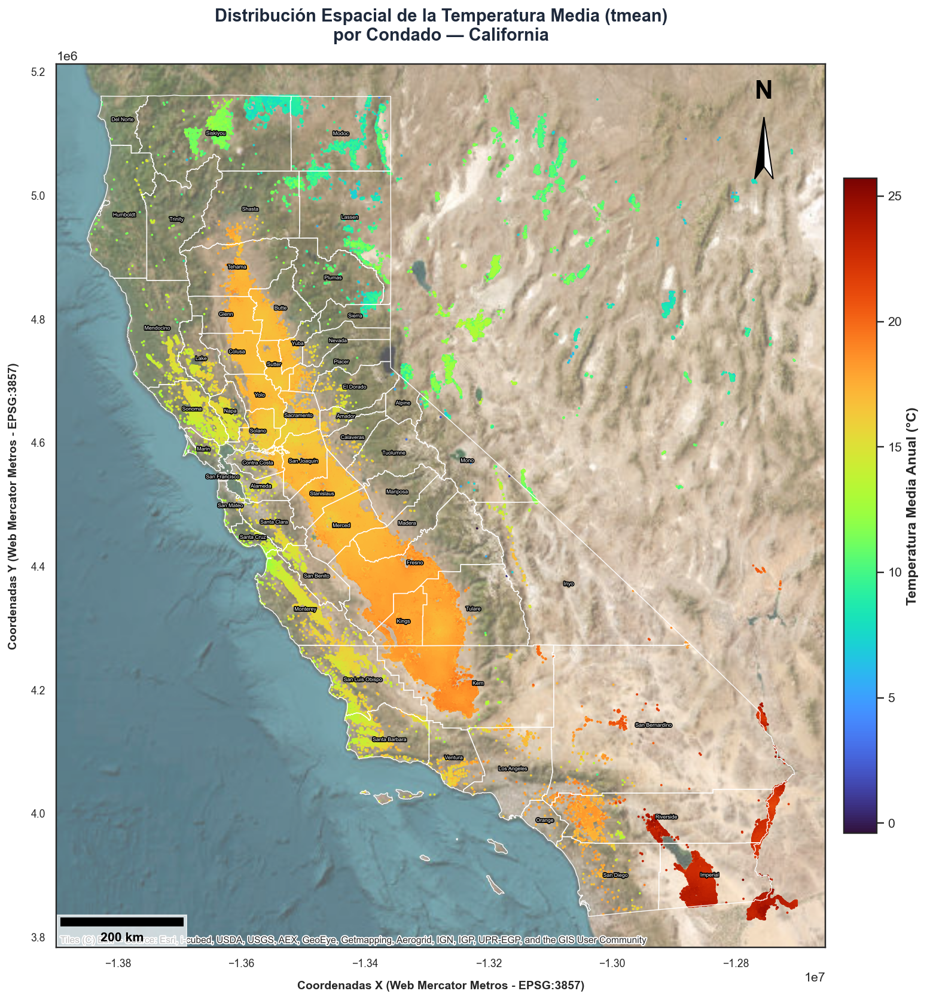

In [114]:
import contextily as cx

# ── 1. Preparar datos ──
df_pandas = df_hist.select([
    pl.col("location").struct.field("coordinates").list.get(0).alias("longitude"),
    pl.col("location").struct.field("coordinates").list.get(1).alias("latitude"),
    "tmean"
]).to_pandas()

geometry = [Point(xy) for xy in zip(df_pandas.longitude, df_pandas.latitude)]
gdf = gpd.GeoDataFrame(df_pandas, geometry=geometry, crs="EPSG:4326")
gdf_projected = gdf.to_crs(epsg=3857)

# ── 2. Reproyectar condados a EPSG:3857 para que coincidan con el basemap ──
gdf_counties_3857 = gdf_counties.to_crs(epsg=3857)

# ── 3. Figura ──
fig, ax = plt.subplots(figsize=(12, 16))

# ── 4. Puntos de temperatura ──
gdf_projected.plot(
    ax=ax,
    column='tmean',
    cmap='turbo',
    legend=True,
    legend_kwds={
        'label': 'Temperatura Media Anual (°C)',
        'shrink': 0.5,
        'pad': 0.02
    },
    markersize=4,
    alpha=1.0,
    edgecolor='none',
    zorder=2
)

# ── 5. Capa de condados encima de los puntos ──
gdf_counties_3857.boundary.plot(
    ax=ax,
    edgecolor='white',      # blanco para contrastar con el basemap satelital
    linewidth=0.7,
    zorder=3
)

# ── 6. Etiquetas de condado ──
for _, row in gdf_counties_3857.iterrows():
    centroid = row['geometry'].centroid
    ax.annotate(
        row['name'],
        xy=(centroid.x, centroid.y),
        fontsize=4.5, ha='center', va='center',
        color='white', zorder=4,
        path_effects=[pe.withStroke(linewidth=1.8, foreground='black')]
    )

# ── 7. Basemap satelital ──
cx.add_basemap(
    ax,
    source=cx.providers.Esri.WorldImagery,
    alpha=0.65,
    zorder=1
)

# ── 8. Elementos cartográficos ──
ax.tick_params(axis='both', which='major', labelsize=9)
ax.set_title(
    "Distribución Espacial de la Temperatura Media (tmean)\npor Condado — California",
    fontsize=15, fontweight='bold', pad=20, color='#1e293b'
)
ax.set_xlabel("Coordenadas X (Web Mercator Metros - EPSG:3857)", fontsize=10, labelpad=10)
ax.set_ylabel("Coordenadas Y (Web Mercator Metros - EPSG:3857)", fontsize=10, labelpad=10)
ax.grid(True, linestyle='--', alpha=0.3, color='white')

# ── 9. Escala gráfica ──
scalebar = ScaleBar(
    1, "m",
    length_fraction=0.20,
    location="lower left",
    font_properties={'size': 11, 'weight': 'bold'},
    box_color='white', box_alpha=0.7, color='black'
)
ax.add_artist(scalebar)

# ── 10. Flecha de norte  ──
x_n, y_n = 0.92, 0.94
ancho = 0.012
alto  = 0.07

izq_verts = [[x_n, y_n], [x_n - ancho, y_n - alto], [x_n, y_n - alto * 0.8]]
der_verts = [[x_n, y_n], [x_n + ancho, y_n - alto], [x_n, y_n - alto * 0.8]]

ax.add_patch(Polygon(izq_verts, facecolor='black', edgecolor='black',
                     transform=ax.transAxes, zorder=5))
ax.add_patch(Polygon(der_verts, facecolor='white', edgecolor='black',
                     transform=ax.transAxes, zorder=5))
ax.text(x_n, y_n + 0.015, 'N', ha='center', va='bottom',
        fontsize=22, fontweight='bold', color='black',
        transform=ax.transAxes, zorder=5)


# ── 11. Ajuste de límites para incluir todos los condados ──
# Obtener el bounding box real del shapefile TIGER en EPSG:3857
minx, miny, maxx, maxy = gdf_counties_3857.total_bounds
margen = 50_000  # 50 km de margen

ax.set_xlim(minx - margen, maxx + margen)
ax.set_ylim(miny - margen, maxy + margen)

plt.tight_layout()
save(fig, "09_mapa_tmean_condados.png")
plt.show()

In [115]:
# Filtramos cuáles variables del diccionario de utils existen en las columnas reales
clima = [c for c in HIST_CLIM_VARS if c in df_hist.columns]

# Calculamos las estadísticas descriptivas vectorizadas en Polars
stats = df_hist.select(clima).describe()

# Creación de un diccionario de renombre dinámico
mapa_nombres = {
    col: f"{meta['name']} ({meta['unit']})" 
    for col, meta in HIST_CLIM_VARS.items() if col in stats.columns
}

# Renombramos las columnas de la tabla de estadísticas de golpe
stats = stats.rename(mapa_nombres)

with pl.Config(tbl_cols=-1, float_precision=2):
    display(stats)

statistic,Precipitacion Anual (mm),Temperatura Media (°C),Temperatura Maxima Media (°C),Temperatura Minima Media (°C),VPD Maximo (hPa),VPD Minimo (hPa)
str,f64,f64,f64,f64,f64,f64
"""count""",633904.00,633904.00,633904.00,633904.00,633904.00,633904.00
"""null_count""",0.00,0.00,0.00,0.00,0.00,0.00
"""mean""",298.67,17.00,24.60,9.40,24.69,2.93
"""std""",195.72,2.62,2.62,2.77,5.15,1.67
"""min""",11.54,-0.40,5.36,-6.15,2.08,0.11
"""25%""",159.00,16.35,23.70,8.84,21.88,1.87
"""50%""",250.76,17.17,24.71,9.64,24.21,2.51
"""75%""",392.64,17.93,25.61,10.42,26.51,3.47
"""max""",2865.19,25.71,33.05,20.03,50.04,15.61


C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\2489940800.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\2489940800.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\2489940800.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\2489940800.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `h

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\10_clima_por_cultivo.png


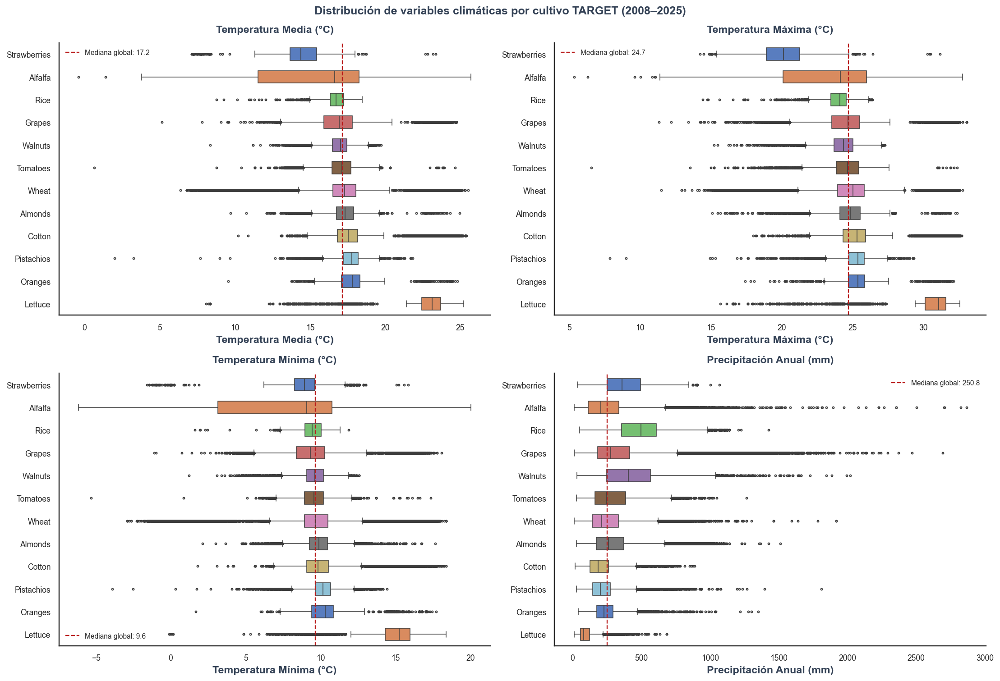

In [116]:
# ── C. Clima por cultivo ─────────────────────────────────────────
clim_plot_vars = [
    ("tmean", "Temperatura Media (°C)"),
    ("tmax",  "Temperatura Máxima (°C)"),
    ("tmin",  "Temperatura Mínima (°C)"),
    ("ppt",   "Precipitación Anual (mm)"),
]

# Orden de cultivos por temperatura media ascendente
orden = (
    df_hist.group_by("crop_name")
    .agg(pl.col("tmean").median().alias("med"))
    .sort("med")["crop_name"]
    .to_list()
)

df_hist_pd = df_hist.select(
    ["crop_name"] + [v for v, _ in clim_plot_vars]
).to_pandas()

fig, axes = plt.subplots(2, 2, figsize=(16, 11))
axes = axes.flatten()

for i, (var, label) in enumerate(clim_plot_vars):
    ax = axes[i]
    sns.boxplot(
        data=df_hist_pd, y="crop_name", x=var, order=orden,
        palette=sns.color_palette("muted", len(orden)),
        width=0.55, linewidth=0.8, fliersize=2, ax=ax
    )
    # Línea de mediana global
    med_global = df_hist_pd[var].median()
    ax.axvline(med_global, color="#b91c1c", lw=1.2, linestyle="--",
               label=f"Mediana global: {med_global:.1f}")
    ax.legend(fontsize=8, frameon=False)
    ax.set_title(label, pad=12, color=COLOR_TEXT)
    ax.set_xlabel(label, color=COLOR_TEXT)
    ax.set_ylabel("", color=COLOR_TEXT)
    ax.tick_params(labelsize=9)
    sns.despine(ax=ax)

plt.suptitle("Distribución de variables climáticas por cultivo TARGET (2008–2025)",
             fontsize=13, fontweight="bold", color=COLOR_TEXT)
plt.tight_layout()
save(fig, "10_clima_por_cultivo.png")
plt.show()

C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\2301810966.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_ppt, x='year', y='ppt', palette='Blues', ax=ax,


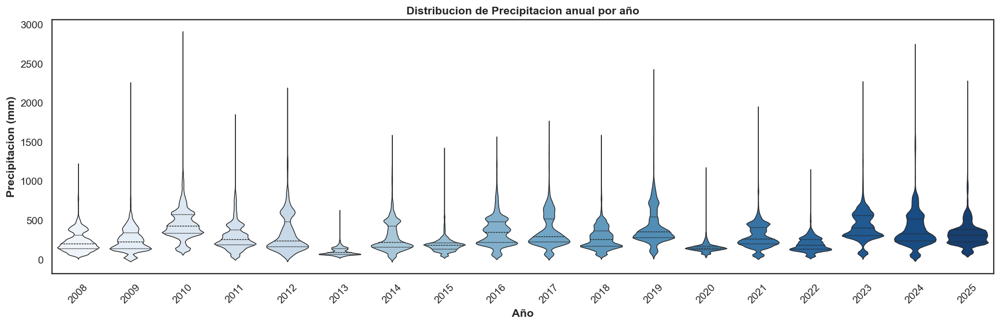

In [117]:
# Violin plot de precipitacion por año
df_ppt = df_hist.select(['year','ppt']).drop_nulls().to_pandas()
fig, ax = plt.subplots(figsize=(15, 5))
sns.violinplot(data=df_ppt, x='year', y='ppt', palette='Blues', ax=ax,
               inner='quartile', linewidth=0.8)
ax.set_title('Distribucion de Precipitacion anual por año', fontweight='bold')
ax.set_xlabel('Año')
ax.set_ylabel('Precipitacion (mm)')
ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR,'11_violin_ppt_year.png'), bbox_inches='tight')
plt.show()

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\12_analisis_vpd.png


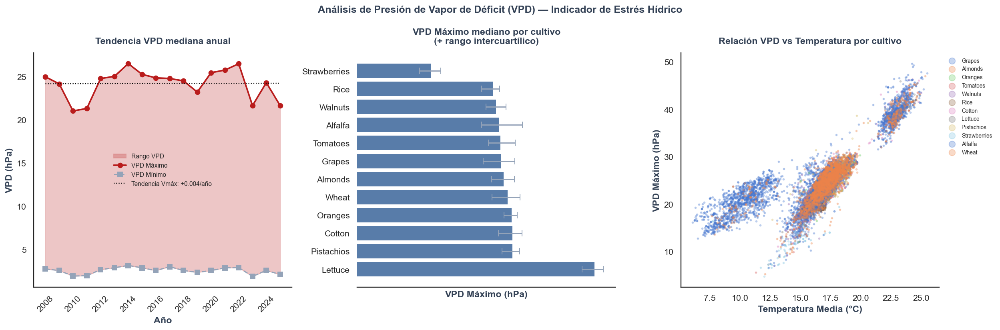

In [118]:
# ── E. Análisis de VPD (estrés hídrico) ─────────────────────────
# VPD alto = mayor estrés hídrico para las plantas
# Es uno de los mejores predictores de rendimiento agrícola

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# E1. Tendencia temporal de vpdmax
vpd_trend = (
    df_hist.group_by("year")
    .agg([
        pl.col("vpdmax").median().alias("vpdmax_med"),
        pl.col("vpdmin").median().alias("vpdmin_med"),
    ])
    .sort("year")
)
ax = axes[0]
yrs = vpd_trend["year"].to_list()
vmax = vpd_trend["vpdmax_med"].to_list()
vmin = vpd_trend["vpdmin_med"].to_list()
ax.fill_between(yrs, vmin, vmax, alpha=0.25, color="#b91c1c", label="Rango VPD")
ax.plot(yrs, vmax, "o-", color="#b91c1c", lw=2, label="VPD Máximo")
ax.plot(yrs, vmin, "s--", color="#94a3b8", lw=1.5, label="VPD Mínimo")
z = np.polyfit(yrs, vmax, 1)
ax.plot(yrs, np.poly1d(z)(yrs), ":", color="black", lw=1.2,
        label=f"Tendencia Vmáx: {z[0]:+.3f}/año")
ax.set_title("Tendencia VPD mediana anual", color=COLOR_TEXT, pad=12)
ax.set_xlabel("Año", color=COLOR_TEXT)
ax.set_ylabel("VPD (hPa)", color=COLOR_TEXT)
ax.legend(fontsize=8, frameon=False)
ax.set_xticks(yrs[::2])
ax.tick_params(axis="x", rotation=45)
sns.despine(ax=ax)

# E2. VPD máximo por cultivo
vpd_crop = (
    df_hist.group_by("crop_name")
    .agg([
        pl.col("vpdmax").median().alias("vpdmax_med"),
        pl.col("vpdmax").quantile(0.25).alias("q25"),
        pl.col("vpdmax").quantile(0.75).alias("q75"),
    ])
    .sort("vpdmax_med", descending=True)
).to_pandas()

ax2 = axes[1]
ax2.barh(vpd_crop["crop_name"], vpd_crop["vpdmax_med"],
         xerr=[vpd_crop["vpdmax_med"] - vpd_crop["q25"],
               vpd_crop["q75"] - vpd_crop["vpdmax_med"]],
         color=COLOR_MAIN, alpha=0.8, edgecolor="none",
         error_kw={"ecolor": "#94a3b8", "capsize": 4})
ax2.set_title("VPD Máximo mediano por cultivo\n(+ rango intercuartílico)",
              color=COLOR_TEXT, pad=12)
ax2.set_xlabel("VPD Máximo (hPa)", color=COLOR_TEXT)
sns.despine(ax=ax2, left=True)
ax2.set_xticks([])

# E3. Scatter VPD vs Temperatura media
sample = df_hist.sample(20000, seed=42).select(
    ["vpdmax", "tmean", "crop_name"]
).drop_nulls().to_pandas()
ax3 = axes[2]
palette_crops = sns.color_palette("muted", sample["crop_name"].nunique())
for j, crop in enumerate(sample["crop_name"].unique()):
    sub = sample[sample["crop_name"] == crop]
    ax3.scatter(sub["tmean"], sub["vpdmax"],
                s=4, alpha=0.3, color=palette_crops[j], label=crop)
ax3.set_xlabel("Temperatura Media (°C)", color=COLOR_TEXT)
ax3.set_ylabel("VPD Máximo (hPa)", color=COLOR_TEXT)
ax3.set_title("Relación VPD vs Temperatura por cultivo", color=COLOR_TEXT, pad=12)
ax3.legend(markerscale=4, fontsize=7, frameon=False,
           bbox_to_anchor=(1.01, 1), loc="upper left")
sns.despine(ax=ax3)

plt.suptitle("Análisis de Presión de Vapor de Déficit (VPD) — Indicador de Estrés Hídrico",
             fontsize=13, fontweight="bold", color=COLOR_TEXT)
plt.tight_layout()
save(fig, "12_analisis_vpd.png")
plt.show()

CLIMA FUTURO — COMPARACION SSP245 vs SSP585
  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\13_clima_futuro_2030.png
  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\13_clima_futuro_2040.png


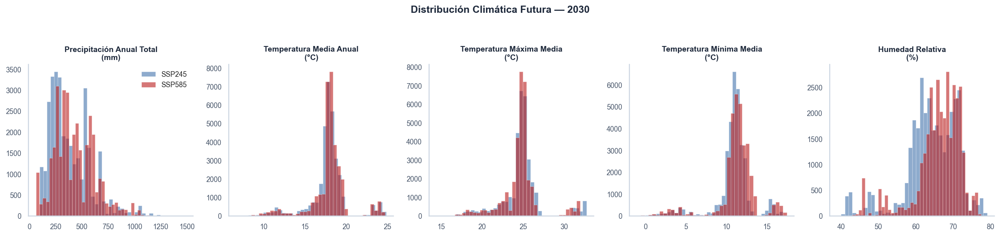

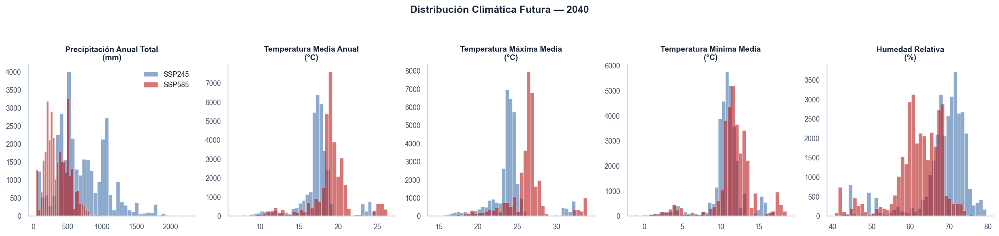

In [119]:
# CLIMA FUTURO: COMPARACION ESCENARIOS 

print("CLIMA FUTURO — COMPARACION SSP245 vs SSP585")
SCENARIOS  = ["245", "585"]

# Validación inicial usando la sintaxis de Polars (.height en lugar de len)
if df_fut.height > 0:
    for year in FUT_YEARS:
        
        # Filtrado estructurado con Polars
        df_y = df_fut.filter(pl.col("year") == year)
        
        # Verificación de DataFrame vacío
        if df_y.is_empty():
            continue

        n_vars_fut = len(FUT_CLIM_VARS)
        fig, axes = plt.subplots(1, n_vars_fut, figsize=(18, 4))

        # Adaptamos el acceso al diccionario (como hicimos en utils.py)
        for i, var_key in enumerate(FUT_CLIM_VARS):
            ax = axes[i]
            
            # Extraemos los metadatos asumiendo la estructura de tu utils.py
            label = FUT_CLIM_VARS[var_key]["name"]
            unit = FUT_CLIM_VARS[var_key]["unit"]
            
            # Colores institucionales: Azul (SSP2-4.5) y Rojo/Granate (SSP5-8.5)
            for sc, color in zip(SCENARIOS, ["#4374ac", "#b91c1c"]):
                col_name = f"{var_key}_{sc}"
                
                if col_name not in df_y.columns:
                    continue
                    
                # Extracción limpia a NumPy ignorando nulos
                data = df_y[col_name].drop_nulls().to_numpy()
                
                ax.hist(data, bins=40, alpha=0.6, color=color,
                        label=f"SSP{sc}", edgecolor="white", linewidth=0.3)

            # Estética limpia para el TFM
            ax.set_title(f"{label}\n({unit})", fontsize=10, fontweight="bold", color="#1e293b")
            ax.tick_params(colors="#475569", labelsize=9)
            ax.grid(False)
            sns.despine(ax=ax, left=False, bottom=False)
            ax.spines['left'].set_color('#cbd5e1')
            ax.spines['bottom'].set_color('#cbd5e1')
            
            if i == 0:
                ax.legend(fontsize=9, frameon=False)

        # Título principal del lienzo
        fig.suptitle(f"Distribución Climática Futura — {year}",
                     fontsize=13, fontweight="bold", color="#1e293b", y=1.05)
        
        fig.tight_layout()
        
        # Guardado utilizando la función estandarizada
        save(fig, f"13_clima_futuro_{year}.png")
        
plt.show()

Tabla de Deltas (Mediana absoluta respecto a 2025):
                   ppt  tmean   tmax   tmin
year scenario                              
2030 SSP245     19.201  0.842  0.801  0.796
     SSP585    104.916  0.943  0.690  1.145
2040 SSP245    337.500  0.321 -0.108  0.664
     SSP585     19.963  1.979  2.378  1.430
  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\14_delta_climatico.png


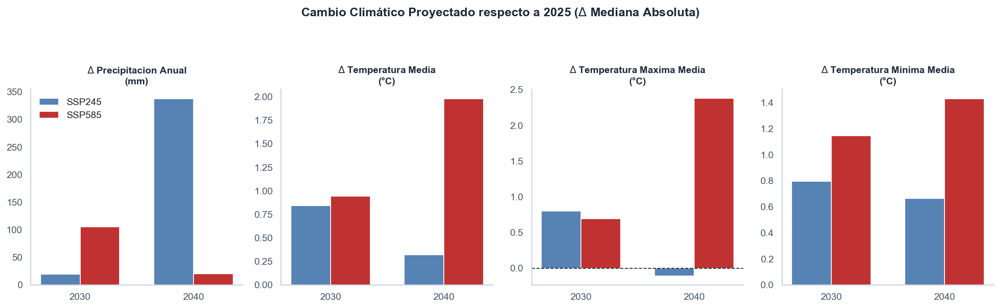

In [120]:
# Mapeo de variables entre el histórico (Polars) y el futuro (Polars)
VAR_MAP_HIST_FUT = {
    "ppt":   "pr",
    "tmean": "tmean",
    "tmax":  "tmax",
    "tmin":  "tmin",
}
SCENARIOS  = ["245", "585"]

# 1. Filtrado correcto en Polars
base_2025 = df_hist.filter(pl.col("year") == 2025)

# 2. Verificación de DataFrames (is_empty() en lugar de .empty)
if not base_2025.is_empty() and df_fut.height > 0:
    
    # 3. Cálculo de la mediana de referencia (2025) de forma segura en Polars
    ref = {}
    for var in VAR_MAP_HIST_FUT:
        if var in base_2025.columns:
            # Extraemos el valor numérico exacto con .item()
            ref[var] = base_2025.select(pl.col(var).median()).item()

    rows = []
    for year in FUT_YEARS:
        # Filtrado de año futuro
        df_y = df_fut.filter(pl.col("year") == year)
        
        for sc in SCENARIOS:
            row = {"year": year, "scenario": f"SSP{sc}"}
            for hist_var, fut_var in VAR_MAP_HIST_FUT.items():
                col = f"{fut_var}_{sc}"
                
                if col in df_y.columns and hist_var in ref:
                    # Cálculo del delta
                    val_futuro = df_y.select(pl.col(col).median()).item()
                    if val_futuro is not None:
                        delta = val_futuro - ref[hist_var]
                        row[hist_var] = round(delta, 3)
            rows.append(row)

    # Convertimos los resultados tabulares a Pandas solo para la visualización del print
    df_delta = pd.DataFrame(rows).set_index(["year", "scenario"])
    print("Tabla de Deltas (Mediana absoluta respecto a 2025):")
    print(df_delta.to_string())

    # ==============================================================================
    # RENDERIZADO DEL GRÁFICO 
    # ==============================================================================
    fig, axes = plt.subplots(1, len(VAR_MAP_HIST_FUT), figsize=(16, 4.5))
    
    x = np.arange(len(FUT_YEARS))
    width = 0.35
    colors = ["#4374ac", "#b91c1c"] # Azul (SSP2-4.5) y Rojo (SSP5-8.5)

    for i, hist_var in enumerate(VAR_MAP_HIST_FUT):
        ax = axes[i]
        
        for j, sc in enumerate(SCENARIOS):
            vals = [
                df_delta.loc[(yr, f"SSP{sc}"), hist_var]
                if (yr, f"SSP{sc}") in df_delta.index and hist_var in df_delta.columns
                else 0
                for yr in FUT_YEARS
            ]
            ax.bar(x + j * width, vals, width, label=f"SSP{sc}", color=colors[j], alpha=0.9)

        # Estética individual de cada subpanel
        ax.axhline(0, color="#1e293b", linewidth=1, linestyle="--")
        
        meta = HIST_CLIM_VARS.get(hist_var, {"name": hist_var, "unit": ""})
        ax.set_title(f"$\Delta$ {meta['name']}\n({meta['unit']})", fontsize=11, fontweight="bold", color="#1e293b")
        ax.set_xticks(x + width / 2)
        ax.set_xticklabels(FUT_YEARS, color="#475569")
        ax.tick_params(axis='y', colors="#475569")
        
        # Limpieza visual cartesiana (estilo TFM)
        ax.grid(False)
        sns.despine(ax=ax)
        ax.spines['left'].set_color('#cbd5e1')
        ax.spines['bottom'].set_color('#cbd5e1')
        
        if i == 0:
            ax.legend(frameon=False)

    fig.suptitle("Cambio Climático Proyectado respecto a 2025 ($\Delta$ Mediana Absoluta)",
                 fontsize=14, fontweight="bold", color="#1e293b", y=1.08)
    
    plt.tight_layout()
    save(fig, "14_delta_climatico.png")
    plt.show()

Delta climático futuro por cultivo:
        crop  year scenario  delta_tmean  delta_tmax  delta_ppt
       Wheat  2030   SSP245        0.732       0.362     22.036
       Wheat  2030   SSP585        0.818       0.229     85.376
       Wheat  2040   SSP245        0.228      -0.499    278.203
       Wheat  2040   SSP585        1.901       1.920      6.803
     Lettuce  2030   SSP245        0.925       1.045      6.145
     Lettuce  2030   SSP585        0.747       0.357    -32.574
     Lettuce  2040   SSP245        0.792       0.717    -39.572
     Lettuce  2040   SSP585        2.316       2.442    -55.010
      Grapes  2030   SSP245        0.958       0.688     85.940
      Grapes  2030   SSP585        1.147       0.643    127.122
      Grapes  2040   SSP245        0.492      -0.094    461.897
      Grapes  2040   SSP585        2.094       2.310     70.736
      Cotton  2030   SSP245        0.490      -0.266     12.729
      Cotton  2030   SSP585        0.611      -0.568     62.900
    

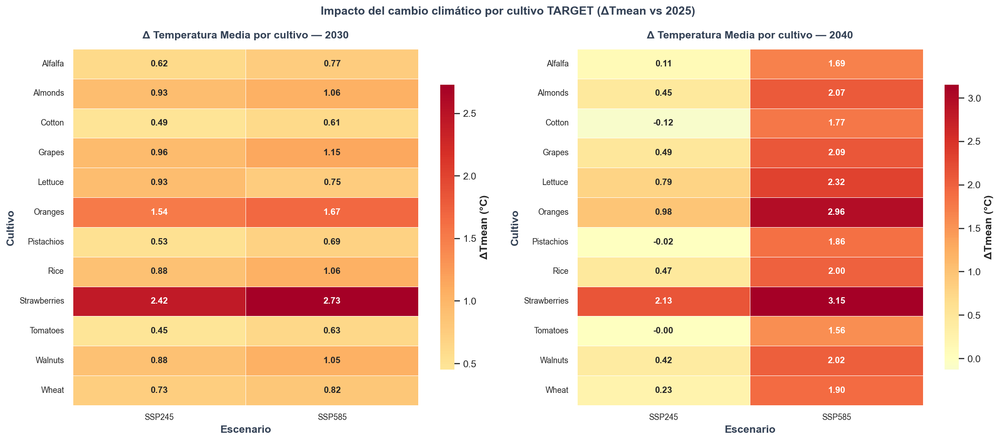

In [121]:
# Delta climático futuro desglosado por cultivo:
# Impacto del cambio climático por cultivo 
# Para cada cultivo: cuánto cambiará tmean, tmax y ppt en su zona geográfica

SCENARIOS = ["245", "585"]
MAP_VARS  = {"tmean": "tmean", "tmax": "tmax", "ppt": "pr"}

resultados = []
for crop in df_hist["crop_name"].unique().to_list():
    ref = (
        df_hist.filter((pl.col("crop_name") == crop) & (pl.col("year") == 2025))
        .select([pl.col(v).median().alias(v) for v in ["tmean", "tmax", "ppt"]])
    )
    if ref.shape[0] == 0:
        continue
    ref_vals = ref.row(0)

    for yr in [2030, 2040]:
        df_fut_crop = df_fut.filter(
            (pl.col("crop_name") == crop) & (pl.col("year") == yr)
        )
        if df_fut_crop.shape[0] == 0:
            continue
        for sc in SCENARIOS:
            row = {"crop": crop, "year": yr, "scenario": f"SSP{sc}"}
            for i, (hv, fv) in enumerate(MAP_VARS.items()):
                col = f"{fv}_{sc}"
                if col in df_fut_crop.columns:
                    fut_val = float(df_fut_crop[col].median())
                    row[f"delta_{hv}"] = round(fut_val - ref_vals[i], 3)
            resultados.append(row)

df_delta_crop = pl.DataFrame(resultados).to_pandas()
print("Delta climático futuro por cultivo:")
print(df_delta_crop.to_string(index=False))

# Heatmap de delta temperatura por cultivo y escenario
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

for ax, yr in zip(axes, [2030, 2040]):
    sub = df_delta_crop[df_delta_crop["year"] == yr]
    pivot = sub.pivot_table(
        index="crop", columns="scenario", values="delta_tmean"
    )
    sns.heatmap(
        pivot, annot=True, fmt=".2f", cmap="RdYlBu_r",
        center=0, linewidths=0.5, ax=ax,
        cbar_kws={"label": "ΔTmean (°C)", "shrink": 0.8},
        annot_kws={"size": 10, "fontweight": "bold"}
    )
    ax.set_title(f"Δ Temperatura Media por cultivo — {yr}",
                 pad=12, color=COLOR_TEXT)
    ax.set_xlabel("Escenario", color=COLOR_TEXT)
    ax.set_ylabel("Cultivo", color=COLOR_TEXT)
    ax.tick_params(labelsize=9)

plt.suptitle("Impacto del cambio climático por cultivo TARGET (ΔTmean vs 2025)",
             fontsize=13, fontweight="bold", color=COLOR_TEXT)
plt.tight_layout()
save(fig, "15_delta_climatico_por_cultivo.png")
plt.show()

# Variables de Suelo

In [122]:
# Resumen Estadístico de las Propiedades Edáficas:

# Seleccionamos las variables numéricas clave de suelos
soil_cols = [
    "claytotal_r", "sandtotal_r", "silttotal_r", 
    "om_r", "ph1to1h2o_r", "awc_r", "profundidad_efectiva_cm"
]

# Filtramos solo las columnas que existan en tu DF y calculamos el resumen
existing_soil_cols = [col for col in soil_cols if col in df2.columns]
display(df2.select(existing_soil_cols).describe())

statistic,claytotal_r,sandtotal_r,silttotal_r,om_r,ph1to1h2o_r,awc_r,profundidad_efectiva_cm
str,f64,f64,f64,f64,f64,f64,f64
"""count""",664220.0,664020.0,664007.0,667723.0,663623.0,667937.0,668940.0
"""null_count""",42474.0,42674.0,42687.0,38971.0,43071.0,38757.0,37754.0
"""mean""",25.091317,42.900273,32.026463,1.757142,7.363598,0.140058,29.446373
"""std""",15.597193,24.144671,14.020867,3.465866,0.826641,0.041196,18.653573
"""min""",0.0,0.0,0.0,0.0,4.0,0.0,1.0
"""25%""",13.0,22.1,19.6,0.75,6.7,0.12,15.0
"""50%""",20.0,39.799999,31.0,1.25,7.5,0.14,25.0
"""75%""",33.5,67.400002,40.0,2.0,8.0,0.16,38.0
"""max""",70.0,98.900002,85.699997,100.0,9.8,0.6,203.0


  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\16_Boxplot_ph_cultivos.png


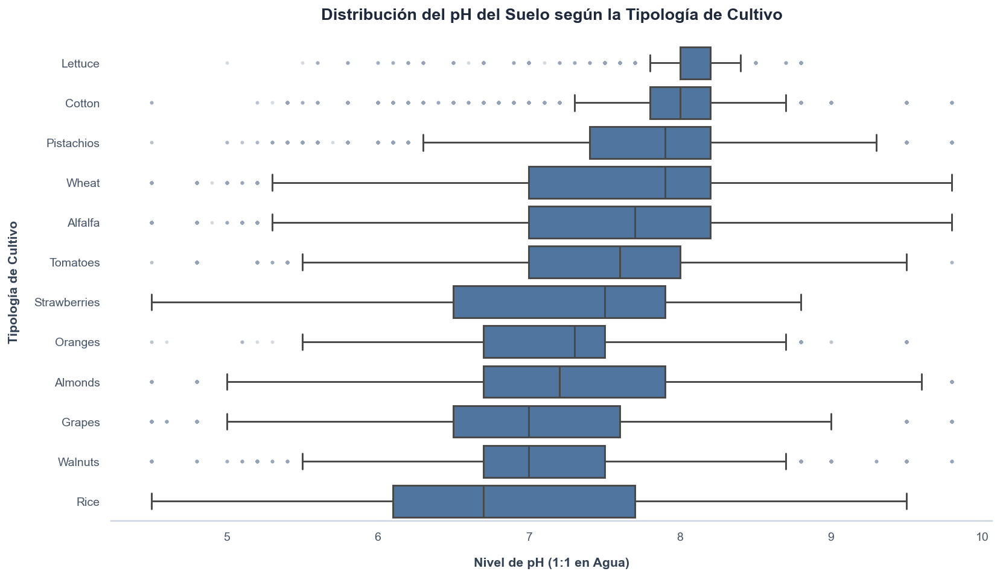

In [123]:
if "ph1to1h2o_r" in df_imputed.columns:
    # 1. Extracción a Pandas
    df_plot = df_imputed.select(["crop_name", "ph1to1h2o_r"]).to_pandas()
    
    # 2. Ordenamiento analítico (de mayor a menor mediana de pH)
    orden_cultivos = df_plot.groupby("crop_name")["ph1to1h2o_r"].median().sort_values(ascending=False).index
    
    # 3. Configuración del lienzo institucional
    sns.set_theme(style="white")
    fig, ax = plt.subplots(figsize=(12, 7))
    
    # 4. Trazado del Boxplot con la paleta académica
    sns.boxplot(
        data=df_plot,
        x="ph1to1h2o_r",
        y="crop_name",
        order=orden_cultivos,
        color="#4374ac",          # Azul académico principal
        linewidth=1.5,            # Grosor de las líneas de la caja
        fliersize=3,              # Tamaño de los valores atípicos (outliers)
        flierprops={              # Suavizado de los outliers para que no saturen la gráfica
            "marker": "o", 
            "markerfacecolor": "#94a3b8", 
            "markeredgecolor": "none", 
            "alpha": 0.4
        },
        ax=ax
    )
    
    # 5. Títulos y tipografía limpia (Latin Modern compatible)
    ax.set_title("Distribución del pH del Suelo según la Tipología de Cultivo", 
                 fontsize=14, fontweight="bold", pad=20, color="#1e293b")
    ax.set_xlabel("Nivel de pH (1:1 en Agua)", fontsize=11, fontweight="semibold", labelpad=12, color="#334155")
    ax.set_ylabel("Tipología de Cultivo", fontsize=11, fontweight="semibold", labelpad=12, color="#334155")
    
    # 6. Limpieza visual cartesiana
    ax.grid(False)
    ax.tick_params(colors="#475569", labelsize=10)
    sns.despine(left=True, bottom=False)
    ax.spines['bottom'].set_color('#cbd5e1')
    
    plt.tight_layout()
    
    # 7. Guardado automático (Descomentar si la función save está cargada)
    save(fig, "16_Boxplot_ph_cultivos.png")
    
    plt.show()

C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\2403844681.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\2403844681.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\2403844681.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
C:\Users\lesli\AppData\Local\Temp\ipykernel_34624\2403844681.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` varia

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\17_suelo_por_cultivo_nt.png


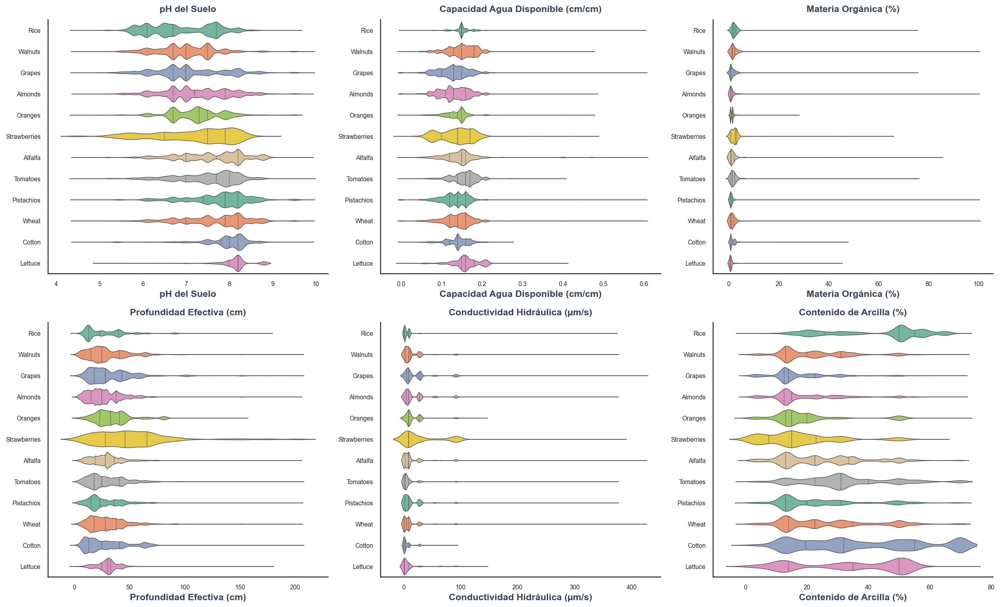

In [124]:
# ── D. Suelo por cultivo ─────────────────────────────────────────
soil_plot = [
    ("ph1to1h2o_r",          "pH del Suelo"),
    ("awc_r",                "Capacidad Agua Disponible (cm/cm)"),
    ("om_r",                 "Materia Orgánica (%)"),
    ("profundidad_efectiva_cm", "Profundidad Efectiva (cm)"),
    ("ksat_r",               "Conductividad Hidráulica (µm/s)"),
    ("claytotal_r",          "Contenido de Arcilla (%)"),
]

orden_ph = (
    df_hist.group_by("crop_name")
    .agg(pl.col("ph1to1h2o_r").median().alias("med"))
    .sort("med")["crop_name"]
    .to_list()
)

df_soil_pd = df_hist.select(
    ["crop_name"] + [v for v, _ in soil_plot]
).to_pandas()

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
axes = axes.flatten()

for i, (var, label) in enumerate(soil_plot):
    ax = axes[i]
    sns.violinplot(
        data=df_soil_pd, y="crop_name", x=var, order=orden_ph,
        palette=sns.color_palette("Set2", len(orden_ph)),
        inner="quartile", linewidth=0.8, ax=ax
    )
    ax.set_title(label, pad=10, color=COLOR_TEXT)
    ax.set_xlabel(label, color=COLOR_TEXT)
    ax.set_ylabel("", color=COLOR_TEXT)
    ax.tick_params(labelsize=8)
    sns.despine(ax=ax)

#plt.suptitle("Distribución de variables edáficas por cultivo TARGET",
            # fontsize=13, fontweight="bold", color=COLOR_TEXT)
plt.tight_layout()
save(fig, "17_suelo_por_cultivo_nt.png")
plt.show()

  [guardado] C:/Users/lesli/Documents/TFM/notebooks/eda_outputs\18_correlacion_suelo_clima.png


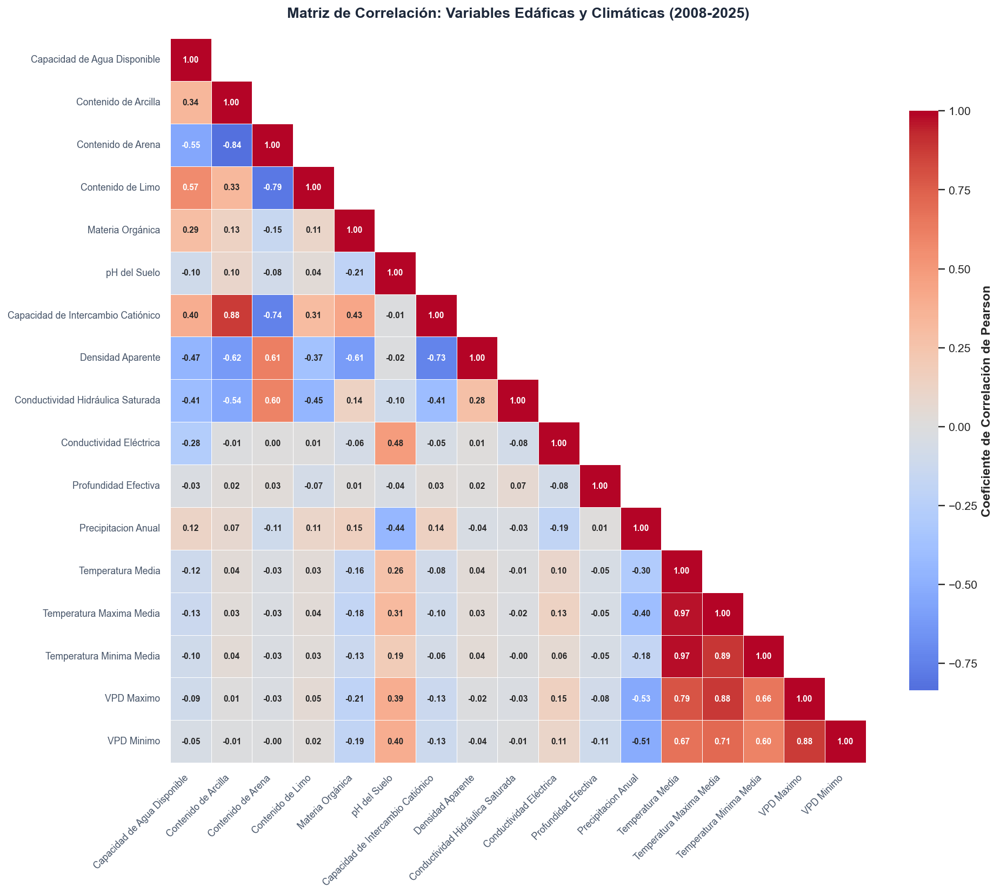

In [125]:
#Correlación entre suelo y clima 
#Identificar columnas válidas presentes en el DataFrame
corr_cols = [
    c for c in list(SOIL_VARIABLES_DICT.keys()) + list(HIST_CLIM_VARS.keys())
    if c in df_hist.columns
]

# Extraer etiquetas 
labels = []
for c in corr_cols:
    if c in SOIL_VARIABLES_DICT:
        labels.append(SOIL_VARIABLES_DICT[c].get("name", c))
    else:
        labels.append(HIST_CLIM_VARS[c].get("name", c))

# Calcular la matriz de correlación
# Pasamos a Pandas solo las columnas numéricas para que Seaborn herede la estructura matricial
corr_matrix = df_hist.select(corr_cols).to_pandas().corr()

# Configuración del lienzo (Estilo Institucional)
sns.set_theme(style="white")
fig, ax = plt.subplots(figsize=(14, 12))

# Creamos una máscara para ocultar la mitad superior del gráfico (redundante)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)

# Renderizado del Mapa de Calor
sns.heatmap(
    corr_matrix, 
    annot=True, 
    fmt=".2f", 
    cmap="coolwarm",       # Paleta divergente perfecta para correlaciones (-1 a 1)
    center=0, 
    linewidths=0.5, 
    ax=ax,
    mask=mask,             # Aplicamos la máscara geométrica
    xticklabels=labels, 
    yticklabels=labels,
    cbar_kws={"label": "Coeficiente de Correlación de Pearson", "shrink": 0.8},
    annot_kws={"size": 8, "fontweight": "bold"} # Números claros dentro de las celdas
)

# Títulos y limpieza visual
ax.set_title("Matriz de Correlación: Variables Edáficas y Climáticas (2008-2025)",
             fontsize=14, fontweight="bold", pad=20, color="#1e293b")

plt.xticks(rotation=45, ha="right", fontsize=9, color="#475569")
plt.yticks(fontsize=9, color="#475569")

# Ajuste automático de márgenes para que los nombres de variables largas no se corten
plt.tight_layout()

# Guardado automático
save(fig, "18_correlacion_suelo_clima.png")
plt.show()

## Datos futuros

In [126]:
# Resumen Estadístico de las Propiedades Edáficas:

display(df_fut.describe())

statistic,year,crop_id,crop_name,is_target,location,processed,ppt,processed_climate,tmax,tmean,tmin,vpdmax,vpdmin,awc_r,cec7_r,claytotal_r,dbthirdbar_r,ec_r,ksat_r,om_r,ph1to1h2o_r,processed_soil,profundidad_efectiva_cm,sandtotal_r,silttotal_r,sumbases_r,es_proyeccion,hurs_245,hurs_585,pr_245,pr_585,referencia_base,tmax_245,tmax_585,tmean_245,tmean_585,tmin_245,tmin_585,vpdmean,lon,lat,vpdmean_245,vpdmean_585,county
str,f64,f64,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,str
"""count""",65830.0,65830.0,"""65830""",65830.0,65830.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,22182.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,0.0,65830.0,65830.0,65830.0,65830.0,"""65830"""
"""null_count""",0.0,0.0,"""0""",0.0,0.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,65830.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,43648.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,65830.0,0.0,0.0,0.0,0.0,"""0"""
"""mean""",2035.0,72.638554,null,0.78165,null,null,null,null,null,null,null,null,null,0.14062,18.863029,24.959711,1.445756,1.894357,14.103967,1.853853,7.29335,1.0,29.144721,42.740916,32.202359,30.598729,1.0,66.345501,63.977354,544.954931,394.04101,2025.0,24.384507,25.468845,17.584075,18.462991,10.783644,11.457137,null,-120.291045,37.331594,13.809285,15.644048,null
"""std""",5.000038,57.173133,null,null,null,null,null,null,null,null,null,null,null,0.040903,12.522261,15.184621,0.154512,3.281068,23.320336,4.026031,0.836261,null,18.428258,23.81788,13.894727,25.175409,null,7.246432,6.625895,331.538947,185.100676,0.0,2.528569,2.575059,2.36783,2.503158,2.363664,2.60757,null,1.769716,1.8624,5.209107,5.317409,null
"""min""",2030.0,2.0,"""Alfalfa""",0.0,null,null,null,null,null,null,null,null,null,0.0,0.0,0.0,0.07,0.0,0.0,0.0,4.5,1.0,1.0,0.9,0.0,0.6,1.0,39.025833,40.438438,55.158955,45.115494,2025.0,14.541255,14.482627,6.813737,6.717456,-1.212355,-1.047712,null,-124.050891,32.509306,5.779992,6.325057,"""Alameda"""
"""25%""",2030.0,36.0,null,null,null,null,null,null,null,null,null,null,null,0.12,10.0,13.0,1.4,0.0,2.7,0.75,6.7,null,15.0,22.1,19.6,11.1,null,62.911045,61.035744,293.329041,257.284485,2025.0,23.646009,24.462399,17.052238,17.74,10.278668,10.784245,null,-121.589283,36.17532,11.030009,12.416832,null
"""50%""",2040.0,69.0,null,null,null,null,null,null,null,null,null,null,null,0.14,15.0,21.0,1.48,1.0,9.0,1.25,7.3,null,25.0,39.799999,32.299999,24.9,null,67.989655,65.103233,485.456482,369.222992,2025.0,24.440737,25.383278,17.670641,18.561308,10.970857,11.533789,null,-120.540659,37.197116,12.477297,14.533997,null
"""75%""",2040.0,75.0,null,null,null,null,null,null,null,null,null,null,null,0.16,25.0,32.0,1.55,2.0,9.2,2.0,8.0,null,38.0,67.199997,40.0,40.1,null,71.335716,68.416031,699.982849,501.607117,2025.0,25.148121,26.602512,18.332607,19.376312,11.73195,12.456991,null,-119.543429,38.803888,14.969346,16.980932,null
"""max""",2040.0,227.0,"""Wheat""",1.0,null,null,null,null,null,null,null,null,null,0.6,105.900002,70.0,1.75,57.5,423.0,100.0,9.8,1.0,203.0,98.900002,85.699997,126.1,1.0,79.566513,78.194855,2248.95166,1308.626953,2025.0,32.690121,33.87085,24.834747,26.266132,17.01284,18.67502,null,-114.100041,41.999484,36.572132,39.406481,"""Yuba"""


# Guardar base de datos
------------------------------------------
Guardar la base de datos limpia en formato Parquet permite reducir el tamaño de almacenamiento, acelerar la carga de datos y preservar los tipos de variables definidos durante el proceso de limpieza. De esta forma, la base procesada puede reutilizarse en las siguientes etapas del proyecto de manera eficiente y reproducible.


In [127]:
# Guardar el dataset limpio y congelado
df_imputed.write_parquet("C:/Users/lesli/Documents/TFM/Data/data_clean.parquet")
df_hist.write_parquet("C:/Users/lesli/Documents/TFM/Data/hist_clean.parquet")
df_fut.write_parquet("C:/Users/lesli/Documents/TFM/Data/fut_clean.parquet")
print("Checkpoint del EDA guardado exitosamente en formato Parquet.")

Checkpoint del EDA guardado exitosamente en formato Parquet.


In [128]:
df_raw.write_parquet("C:/Users/lesli/Documents/TFM/Data/raw_data.parquet")